In [1]:
#basic libraries
import numpy as np
import math as m
import glob, os
import pandas as pd
from matplotlib import pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from IPython.display import Image, display


#advanced libraries
import regex as re
import scipy 
from scipy.fft import fft, fftfreq
from scipy.signal import savgol_filter
from scipy.interpolate import UnivariateSpline
from geopy.distance import geodesic  # You can also use geopy to calculate distances
import folium



#ocean libraries
import gsw

# Sea-Bird imports
import seabirdscientific.conversion as conv
import seabirdscientific.processing as proc
import seabirdscientific.instrument_data as id
import seabirdscientific.visualization as viz

## Download the Data

In [2]:
path = r'/Users/romane/Library/CloudStorage/OneDrive-UBC/UBC/Winter Term 2/EOSC 573/Project/SatellitePassage_Data/Downcasts'
filetype = 'csv'

file_list = sorted(glob.glob(os.path.join(path, f'*.{filetype}')))

ebb_data = []
slack_data = []

for i in range(len(file_list)):
    if i<8:
        ebb_data.append(pd.read_csv(file_list[i]))
        ebb_data[i]['Sample']=ebb_data[i].index
        ebb_data[i]['Datetime'] = pd.to_datetime(ebb_data[i]['Date'] + ' ' + ebb_data[i]['Time'])
    else:
        slack_data.append(pd.read_csv(file_list[i]))
        slack_data[i-8]['Sample']=slack_data[i-8].index
        slack_data[i-8]['Datetime'] = pd.to_datetime(slack_data[i-8]['Date'] + ' ' + slack_data[i-8]['Time'])
        
        

# 1. Remove Noise In Pressure
1. Remove White Noise in the Sensors #FFT
2. Remove Entrainment

In [3]:
def get_frequency_noise(data,samplingfreq,minfreq,param):
    param_to_detrend = data[param]
    Npoints = len(param_to_detrend)
    freqs = np.arange(1,Npoints)/Npoints * samplingfreq
    log10f = np.log10(freqs)
    log10FFT = np.log10(np.abs(fft(scipy.signal.detrend(param_to_detrend))))[1:]
    title = data['StationID'].iloc[0] + 'FFT'
    
    #PLOTTING
    fig,ax=plt.subplots(figsize=[8,6])

    ax.plot(log10f,log10FFT)

    #make pretty
    minfreqlog10 = np.log10(minfreq)
    ticks = plt.gca().get_xticks()
    ticksnew = [f'{10**tick:.2f}' for tick in ticks]
    plt.xticks(ticks,ticksnew)
    plt.grid(which='both', linestyle=':', linewidth=1, color='gray')  # Minor grid lines
    plt.axvline(x=minfreqlog10,color='red')
    plt.xlabel('Frequency')
    plt.xlim(log10f[0],log10f[-1])
    plt.ylabel('FFT')
    plt.title(title)
    # plt.show()


In [998]:
# for i in range(len(ebb_data)):
#     data=ebb_data[i]
#     samplingfreq=10
#     minfreq=0.9 #guess
    
#     # get_frequency_noise(data,samplingfreq,minfreq,'Pressure')
    

In [750]:
# plt.plot(ebb_data[5]["Temperature"].iloc[450:1000])

In [751]:
# for i in range(len(ebb_data)):
#     data=ebb_data[i]
#     samplingfreq=10
#     minfreq=0.9 #guess
    
#     get_frequency_noise(data,samplingfreq,minfreq,'Temperature')

In [4]:
# for i in range(len(slack_data)):
#     data=slack_data[i]
#     samplingfreq=20
#     minfreq=1.6 #guess
    
#     get_frequency_noise(data,samplingfreq,minfreq)

- Let's agree that for the 10 Hz sampling, the max frequency is 0.9 and for the 20 Hz sampling the max frequency is 1.6
      - This means do moving average on all > 0.9 Hz so 11 samples for ebb or moving average on all > 1.5 Hz so 13 samples
- Agree on moving average window of 11, 13 


In [5]:
mov_window = [int(1/0.9*10),int(1/1.5*20)]#ebb,slack

for i in range(len(ebb_data)):
    ebb_data[i]["PressureFFT"] = ebb_data[i]["Pressure"].rolling(window=mov_window[0],min_periods=1,center=True).mean()

for i in range(len(slack_data)):
    slack_data[i]["PressureFFT"] = slack_data[i]["Pressure"].rolling(window=mov_window[1],min_periods=1,center=True).mean()

In [754]:
# Plot and see difference for station E1 during ebb
# # Also remove when going up or when decelerating

# data = ebb_data[0]
# detrended = scipy.signal.detrend(data["Pressure"])

# grad1 = np.gradient(detrended)
# grad2 = np.gradient(grad1)

# #Want Downward Speed and No deceleration
# cond1 = (grad1 > 0)
# grad2 = np.gradient(grad1[cond1])
# cond2 = (grad2 > 0)
# pressure1,sample1 = data['Pressure'][cond1],data['Sample'][cond1]
# pressure2,sample2 = pressure1[cond2],sample1[cond2]

# fig = go.Figure()
# # fig.add_trace(go.Scatter(x=data['Sample'],y=-data['Pressure'],mode='lines',name='Raw',line=dict(color='blue', width=1)))
# fig.add_trace(go.Scatter(x=sample1,y=np.gradient(pressure1),mode='lines',name='No-Up',line=dict(color='gray', width=1)))
# fig.add_trace(go.Scatter(x=sample2,y=np.gradient(pressure2),mode='lines',name='No Decceleration',line=dict(color='black', width=1)))
# fig.update_layout(width=800,height=1000) 
# fig.show()




In [6]:
#Create the function
mov_window = [int(1/0.9*10),int(1/1.5*20)]#ebb,slack

def filter_pressure(data,mov_window): #returns the data with the updated filtered
    
    data['PressureFFT'] = data['Pressure'].rolling(window=mov_window,min_periods=1,center=True).mean() #removing the noise
    
    grad1=np.gradient(data["PressureFFT"])
    cond1=grad1>0
    pressurefilt = data['PressureFFT'].copy()[cond1]
    sample=data['Sample'].copy()[cond1]
    sample=sample.reset_index()
    pressurefilt=pressurefilt.reset_index()
    
    rows_to_drop = []
    
    for i in range(1, len(sample)):
        # Check if the difference between consecutive 'Sample' values is greater than 1
        if (sample['Sample'][i] - sample['Sample'][i-1]) > 1:
            range_idx = [sample['Sample'][i-1], sample['Sample'][i]]
            
            # Find the maximum PressureFFT value in the range of indices
            maxp = data["PressureFFT"][range_idx[0]:range_idx[1]].max()
            
            count = 0
            # Collect rows to drop based on the condition of PressureFFT
            while (range_idx[1] + count < len(data)) and (i+count < len(pressurefilt)) and (pressurefilt["PressureFFT"].iloc[i + count] < maxp):
                rows_to_drop.append(i + count)  # Append indices to the rows_to_drop list
                count += 1
            
            # After finishing the loop, check if the last index met the condition to drop the last row
            if range_idx[1] + count - 1 < len(data) and pressurefilt["PressureFFT"].iloc[i + count - 1] < maxp:
                rows_to_drop.append(i + count - 1)
    
    # Drop all rows that are collected in rows_to_drop
    pressurefilt.drop(rows_to_drop, inplace=True)
    sample.drop(rows_to_drop, inplace=True)

    #No deceleration

    # grad2=np.gradient(np.gradient(pressurefilt["PressureFFT"]))
    # cond2=grad2>0
    # pressurefilt = pressurefilt[cond2]
    # sample = sample[cond2]
    
    pressurefilt.set_index('index', inplace=True)
    pressurefilt.rename(columns={'PressureFFT': 'PressureFilt'}, inplace=True)

    sample.set_index('index', inplace=True)
    sample.rename(columns={'Sample':'SampleFilt'},inplace=True)
    
    

    # pressurefilt = data['PressureFFT'][cond1]
    # pressurefilt = pressurefilt[cond2]
    # pressurefilt = pd.DataFrame(pressurefilt).rename(columns={'PressureFFT':'PressureFilt'})
    newdata = pd.concat([data,pressurefilt,sample],ignore_index=False,axis=1)

    #compute depth and flags
    data_lat = data["Latitude"][0]
    newdata["Depth"] = conv.depth_from_pressure(pressure_in=newdata["PressureFilt"],latitude=data_lat,depth_units='m',pressure_units=['PSU'])
    newdata["Flag"] = 0 #don't put flags because no soaking 

    
    return newdata

for i in range(len(ebb_data)):
    ebb_data[i]=filter_pressure(ebb_data[i],mov_window[0])

for i in range(len(slack_data)):
    slack_data[i]=filter_pressure(slack_data[i],mov_window[1])

# fig = go.Figure()
# fig.add_trace(go.Scatter(x=ebb_data[0]['Sample'],y=(-data['PressureFFT']),mode='lines+markers'))
# fig.add_trace(go.Scatter(x=ebb_data[0]['Samplefilt'],y=(-pressurefilt['Pressurefilt']),mode='lines+markers'))
# fig.update_layout(height=1000,width=800)
# fig.show()

In [756]:
# fig = go.Figure()
# # fig.add_trace(go.Scatter(x=ebb_data[0]['Sample'],y=(-ebb_data[0]['PressureFFT']),mode='lines+markers'))
# fig.add_trace(go.Scatter(x=ebb_data[0]['SampleFilt'],y=(-ebb_data[0]['PressureFilt']),mode='lines+markers'))
# fig.update_layout(height=1000,width=800)
# fig.show()

In [7]:
ebb_clr = []
slack_clr = []
for i in range(len(ebb_data)):
    ebb_clr.append(ebb_data[i].dropna(subset=['PressureFilt']).copy().reset_index())

for i in range(len(slack_data)):
    slack_clr.append(slack_data[i].dropna(subset=['PressureFilt']).copy().reset_index())

___
# Let's try using a Low Pass Filter

In [8]:
def LowPassFilter_CTD(data,samplingfreq):
    data_lat = data["Latitude"][0]
    data["Flag"] = np.zeros(len(data))

    p = data['Pressure']
    scanrate = 1/samplingfreq
    time_const = 0.01

    data["PressureLF"] = proc.low_pass_filter(x=p, time_constant=1*scanrate, sample_interval=scanrate)


    # proc.loop_edit_pressure(pressure=data["PressureLF"].values,latitude=data_lat,flag=data["Flag"].values,sample_interval=scanrate,min_velocity_type=proc.MinVelocityType.FIXED,min_velocity=0.05,window_size=3,mean_speed_percent=20,remove_surface_soak=False,min_soak_depth=1,max_soak_depth=4,use_deck_pressure_offset=False,exclude_flags=True,flag_value=-9.99e-29)
    # data["Depth"] = conv.depth_from_pressure(pressure_in=data["PressureLF"],latitude=data_lat,depth_units='m',pressure_units=['PSU'])
    # data["Flag"] = 0 #don't put flags because no soaking 




for i in range(len(ebb_data)):
    LowPassFilter_CTD(ebb_clr[i],10)
    
for i in range(len(slack_data)):
    LowPassFilter_CTD(slack_clr[i],20)



In [957]:
diff = abs(ebb_clr[0]['PressureLF']-(ebb_clr[0]['PressureFilt']))/(0.5*((ebb_clr[0]['PressureLF'])+(ebb_clr[0]['PressureFilt'])))
                                                                                                         
np.mean(diff*100)

0.16304057757919263

In [941]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ebb_clr[0]['Sample'],y=(scipy.signal.detrend(ebb_clr[0]['PressureLF'])-scipy.signal.detrend(ebb_clr[0]['PressureFilt'])),name='with filter by me',mode='markers'))


In [9]:
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=slack_clr[0]['Sample'],y=-slack_clr[0]['PressureLF'],name='with filter by me'))
# fig.add_trace(go.Scatter(x=slack_clr[0]['Sample'],y=-slack_clr[0]['PressureFilt'],name='with filter by me no LF'))
# fig.add_trace(go.Scatter(x=slack_clr[0]['Sample'],y=-slack_clr[0]['Pressure'],name='nothing'))
# fig.show()


In [761]:
# def plot(data, title, x_names,x_bounds,y_names=['PressureLF'],liftpen=False):
#     config = viz.ChartConfig(
#         title=title,
#         x_names=x_names,
#         y_names=y_names,
#         z_names=[],
#         chart_type="overlay",
#         bounds={
#             "x": x_bounds,
#             # 'y': { 0: [29, 32], 1: [29, 32], 2: [29, 32], 3: [29, 32] }
#         },
#         plot_loop_edit_flags=False,
#         lift_pen_over_bad_data=liftpen)

#     chart_data = viz.ChartData(data, config)
#     fig = viz.plot_xy_chart(chart_data, config)
#     fig["layout"]["yaxis"]["autorange"] = "reversed"
#     fig.update_layout(height=1000,
#         width=800)
    
#     for trace in fig.data:
#         trace.update(line=dict(width=3))

#     return fig

# data=ebb_clr[0]
# range_x = [data['PressureLF'].min()-0.1,data['PressureLF'].max()+0.1]
# x_bounds = {0:range_x,1:range_x,2:range_x,3:range_x}
# fig=plot(data,'Pressure',['PressureLF','PressureFilt'],x_bounds,['Sample'],liftpen=True)
# fig.show()

In [10]:
for i in range(len(ebb_clr)):
    # Remove rows where 'Flag' is less than 0
    ebb_clr[i]=ebb_clr[i][ebb_clr[i]['Flag'] >= 0]
    ebb_clr[i].reset_index(drop=True, inplace=True)

for i in range(len(slack_clr)):
    # Remove rows where 'Flag' is less than 0
    slack_clr[i]=slack_clr[i][slack_clr[i]['Flag'] >= 0]
    slack_clr[i].reset_index(drop=True, inplace=True)

In [234]:
# DO EVERYTHING JUST BY RUNNING THIS

ebb_data = []
slack_data = []

for i in range(len(file_list)):
    if i<8:
        ebb_data.append(pd.read_csv(file_list[i]))
        ebb_data[i]['Sample']=ebb_data[i].index
        ebb_data[i]['Datetime'] = pd.to_datetime(ebb_data[i]['Date'] + ' ' + ebb_data[i]['Time'])
    else:
        slack_data.append(pd.read_csv(file_list[i]))
        slack_data[i-8]['Sample']=slack_data[i-8].index
        slack_data[i-8]['Datetime'] = pd.to_datetime(slack_data[i-8]['Date'] + ' ' + slack_data[i-8]['Time'])


mov_window = [int(1/0.9*10),int(1/1.5*20)]#ebb,slack
for i in range(len(ebb_data)):
    ebb_data[i]["PressureFFT"] = ebb_data[i]["Pressure"].rolling(window=mov_window[0],center=True).mean()

for i in range(len(slack_data)):
    slack_data[i]["PressureFFT"] = slack_data[i]["Pressure"].rolling(window=mov_window[1],center=True).mean()


for i in range(len(ebb_data)):
    ebb_data[i]=filter_pressure(ebb_data[i],mov_window[0])

for i in range(len(slack_data)):
    slack_data[i]=filter_pressure(slack_data[i],mov_window[1])


ebb_clr = []
slack_clr = []
for i in range(len(ebb_data)):
    ebb_clr.append(ebb_data[i].dropna(subset=['PressureFilt']).copy().reset_index())

for i in range(len(slack_data)):
    slack_clr.append(slack_data[i].dropna(subset=['PressureFilt']).copy().reset_index())

for i in range(len(ebb_data)):
    LowPassFilter_CTD(ebb_clr[i],10)
    
for i in range(len(slack_data)):
    LowPassFilter_CTD(slack_clr[i],20)

for i in range(len(ebb_clr)):
    # Remove rows where 'Flag' is less than 0
    ebb_clr[i]=ebb_clr[i][ebb_clr[i]['Flag'] >= 0]
    ebb_clr[i].reset_index(drop=True, inplace=True)

for i in range(len(slack_clr)):
    # Remove rows where 'Flag' is less than 0
    slack_clr[i]=slack_clr[i][slack_clr[i]['Flag'] >= 0]
    slack_clr[i].reset_index(drop=True, inplace=True)

____
# 2. __Treat the Temperature and Salinity Data__

In [235]:
def get_gsw_values(data):
    data['salinity'] = gsw.SP_from_C(
        C=data['Conductivity_aligned'].values,
        t=data['Temperature_aligned'].values,
        p=data['PressureFilt'].values)
        
    data["abs_salinity"] = gsw.SA_from_SP(
        SP=data["salinity"].values, p=data["PressureFilt"].values, lon=data["Longitude"][0], lat=data["Latitude"][0])
    
    data['conservative_t'] = gsw.CT_from_t(
        SA=data['abs_salinity'].values,
        t=data['Temperature_aligned'].values,
        p=data['PressureFilt'].values)
    
    data['pot_density_anomaly'] = gsw.density.sigma1(
        SA=data['abs_salinity'].values,
        CT=data['conservative_t'].values)


In [236]:
#FilterandAlign
# This function will remove the noise in the pressure, temperature and conductivity + will create flags
# where loop (going up/deccelerating) is observed
import numpy as np
import pandas as pd

import numpy as np
import pandas as pd

def remove_BIGspikes(data, window, threshold, min_spike_length, name):
    data_copy = data.copy()
    data=data_copy["Conductivity"]
    
    # Loop through the data to find potential peaks
    for i in range(window, len(data) - window- 1):
        # Check if the current point is a peak (compared to neighbors)
        if ((data.iloc[i] > data.iloc[i-1]) & (data.iloc[i] > data.iloc[i+1])) | ((data.iloc[i] < data.iloc[i-1]) & (data.iloc[i] < data.iloc[i+1])):
            if ((data.iloc[i] > data.iloc[i-5]) & (data.iloc[i] > data.iloc[i+5])) | ((data.iloc[i] < data.iloc[i-5]) & (data.iloc[i] < data.iloc[i+5])):
                peak_value = data[i]
                
                # If the peak exceeds the threshold, consider it a spike
                if (peak_value > (data.iloc[i-window] + threshold) and peak_value > (data.iloc[i+window] + threshold)) \
                or (peak_value < (data.iloc[i-window] - threshold) and peak_value < (data.iloc[i+window] - threshold)):
                    # print(f'Big Spike Detected @ {name}, Peak Value: {peak_value} at index {i}')
                    
                    # Find the start of the spike (go backwards)
                    if (peak_value > (data.iloc[i-window] + threshold)) or (peak_value > (data.iloc[i+window] + threshold)): #positive spike
                        start = i
                        while start > 2 and ((data.iloc[start] - data.iloc[start-1] > 0) or (data.iloc[start] - data.iloc[start-5] > 0)):
                            start -= 1
                        # Find the end of the spike (go forwards)
                        end = i
                        while end < len(data)-2 and ((data.iloc[start] - data.iloc[end+1] > 0) or (data.iloc[start] - data.iloc[end+5] > 0)):
                            end += 1
                    else:
                        # print(f'Big Spike Detected @ {name}, Peak Value: {peak_value} at index {i}')
                        start = i
                        while start > 2 and ((data.iloc[start] - data.iloc[start-1] < 0) or (data.iloc[start] - data.iloc[start-7] < 0)):
                            start -= 1
                        # Find the end of the spike (go forwards)
                        end = i
                        while end < len(data)-2 and ((data.iloc[end] - data.iloc[end+1] < 0) or (data.iloc[end] - data.iloc[end+7] < 0)):
                            end += 1
                            

                        
                    # Ensure the spike has a minimum length
                    if (end - start) >= min_spike_length:
                        print(f'Big Spike Detected @ {name}, Peak Value: {peak_value} at index {i}')
                        # Mark the spike and surrounding points for removal
                        data.loc[start:end+1] = np.nan
                        
                        # Interpolate the removed points with a straight line
                        data = data.interpolate(method='linear')

    return data



def filterAlign_CT(data,scanrate):
    time_const_P =0.01
    time_const_T,time_const_C = 0.1,0.025
    offsetT = time_const_T-time_const_P
    offsetC = time_const_C-time_const_P
    #time response pressure = 10ms
    #time response temperature = 100 ms (0.9s offset)
    #time response conductivity = 25s (0.015s offset)
    if scanrate >= 0.1:
        mov_window=5
    else:
        mov_window=7

    #advance and filtering of temperature
    # data["Temperature_filt"] = proc.low_pass_filter(x=data["Temperature"], time_constant=0.75, sample_interval=scanrate)
    
    data["Temperature_filt"] = data["Temperature"].rolling(window=mov_window, center=True).mean()
    data["Temperature_aligned"] = proc.align_ctd(x=data["Temperature_filt"], offset=offsetT, sample_interval=scanrate)
    # data["Temperature_aligned"] = proc.align_ctd(x=data["Temperature"], offset=offsetT, sample_interval=scanrate)
    # data['Temperature_filt'] = data['Temperature_aligned'].rolling(window=mov_window).mean()

    #advance and filtering of Conductivity
    data["Conductivity"] =  remove_BIGspikes(data,12,0.05,8,data["StationID"][0])
    data["Conductivity_filt"] = data["Conductivity"].rolling(window=mov_window, center=True).mean()
    # data["Conductivity_filt"] = proc.low_pass_filter(x=data["Conductivity"], time_constant=0.20, sample_interval=scanrate)
    data["Conductivity_aligned"] = proc.align_ctd(x=data["Conductivity_filt"], offset=offsetC, sample_interval=scanrate)
    # data["Conductivity_aligned"] = proc.align_ctd(x=data["Conductivity"], offset=offsetC, sample_interval=scanrate)
    # data['Conductivity_filt'] = data['Conductivity_aligned'].rolling(window=mov_window).mean()
    # data.dropna(subset=['Temperature_filt','Conductivity_filt'], inplace=True)
    

In [237]:
scanrate = [0.10001,0.1,0.1,0.1,0.1,0.1,0.1,0.1]
for i in range(len(ebb_clr)):
    print(i)
    ebb_clr[i] = ebb_clr[i][["StationID","Longitude","Latitude","Pressure","Temperature","Conductivity","Oxygen","Depth","PressureFilt","Flag","PressureLF"]].copy()
    ebb_clr[i]["Sample"]=ebb_clr[i].index
    filterAlign_CT(ebb_clr[i],scanrate[i])
    ebb_clr[i].dropna(inplace=True)
    
    # ebb_clr[i].drop_duplicates(subset='Depth_bin',inplace=True)
    ebb_clr[i].reset_index(drop=True, inplace=True)
    
    get_gsw_values(ebb_clr[i])
    ebb_clr[i] = ebb_clr[i].drop(ebb_clr[i].iloc[-10:-1].index, inplace=False)
    

scanrate = [0.05,0.05,0.050001,0.05,0.0500001,0.05]
for i in range(len(slack_clr)):
    print(i)
    slack_clr[i] = slack_clr[i][["StationID","Longitude","Latitude","Pressure","Temperature","Conductivity","Oxygen","Depth","PressureFilt","Flag","PressureLF"]]
    slack_clr[i]["Sample"]=slack_clr[i].index
    filterAlign_CT(slack_clr[i],scanrate[i])
    slack_clr[i].dropna(inplace=True)
    

    # slack_clr[i].drop_duplicates(subset='Depth_bin',inplace=True)
    slack_clr[i].reset_index(drop=True, inplace=True)
    
    get_gsw_values(slack_clr[i])
    slack_clr[i] = slack_clr[i].drop(slack_clr[i].iloc[-10:-1].index, inplace=False)


0
Big Spike Detected @ E1, Peak Value: 31.82 at index 483
1
2
3
Big Spike Detected @ E4, Peak Value: 32.858 at index 1205
4
5


/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_52367/1396540519.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_52367/1396540519.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



6
7
0
1
2
Big Spike Detected @ S3, Peak Value: 31.328 at index 822
3
4
5


/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_52367/1396540519.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [1060]:
# data =ebb_clr[3]
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=data['Temperature'],y=-data["PressureFilt"],xaxis='x1',mode='lines+markers'))
# fig.add_trace(go.Scatter(x=data['Temperature_aligned'].iloc[1:-1],y=-data["PressureFilt"].iloc[1:-1],xaxis='x1',mode='lines',name='TempAv'))
# # fig.add_trace(go.Scatter(x=data['TemperatureA'].iloc[1:-1],y=-data["PressureFilt"].iloc[1:-1],xaxis='x1',name='TempA'))



# # fig.add_trace(go.Scatter(x=data['salinity'],y=-data["PressureFilt"],xaxis='x1',mode='lines+markers'))
# # fig.add_trace(go.Scatter(x=data['ConductivityMOD'],y=-data["PressureFilt"],xaxis='x2',name='CondAv'))
# # fig.add_trace(go.Scatter(x=data['ConductivityAv'],y=-data["PressureFilt"],xaxis='x2'))


# # fig.add_trace(go.Scatter(x=data['salinity'].iloc[1:-1],y=-data["PressureFilt"].iloc[1:-1],name='Salinity',xaxis='x3'))


# fig.update_layout(width=800,height=1000,margin=dict(b=100),
#     xaxis=dict(
#         title="Temperature",  # Title for the first x-axis
#         side='bottom',  # Position the first x-axis on the top
#         # range=[30,40]
#     ),
#     xaxis2=dict(
#         title="Conductivity",  # Title for the second x-axis
#         side='bottom',  # Position the second x-axis on the bottom
#         overlaying='x',  # This makes the second x-axis overlay the first one
#         # range=[30, 35]
#     ),
#     xaxis3=dict(
#         title="Salinity",  # Title for the second x-axis
#         side='bottom',  # Position the second x-axis on the bottom
#         overlaying='x',  # This makes the second x-axis overlay the first one
#         # range=[30, 35]
#     ))



# 2. Now Look Into Lowering Speed

In [238]:
#want to take 2m or 1.5m difference to get mean value across 2 meters
# going at about 0.20m/s with 10Hz = 10 s --> 51 sampling window for velocity
# similarly for 20Hz going at about 0.30 m/s with 20 Hz = 10s --> 131 sampling window for velocity

def lowering_speed(data,interval_p,proc_window,scanrate):
    
    dd_forward,dd_backward = data['Depth'].diff(periods=interval_p).copy(),data['Depth'].diff(periods=-interval_p).copy() #difference in filtered depth from filtered pressure across 2 meters
    dd = (dd_backward - dd_forward)/2
    dt_forward,dt_backward = data["Sample"].diff(periods=interval_p),data["Sample"].diff(periods=-interval_p)
    dt = (dt_backward - dt_forward)/2 * scanrate
    
    # Compute the raw and filtered fall speeds, drop NaN values
    F = (dd / dt).dropna()
    F_raw = dd / dt
    
    # Get the indices and corresponding sample data
    idx = F.index
    x = data['Sample'].iloc[idx]
    flags = data['Flag']
    
    smooth = F.rolling(window=proc_window,center=True).mean()
    
    data['Fall Speed'] = np.nan 
    data.loc[idx, 'Fall Speed'] = smooth
    
    # Assign the raw fall speed to a new column
    data['Fall Speed Raw'] = F_raw
    # print(np.mean(smooth))


for i in range(len(ebb_data)):
    interval_p,proc_window,scanrate=101,41,0.1
    lowering_speed(ebb_clr[i],interval_p,proc_window,scanrate)

for i in range(len(slack_data)):
    interval_p,proc_window,scanrate=131,41,0.05
    lowering_speed(slack_clr[i],interval_p,proc_window,scanrate)

In [778]:
# for i in range(len(ebb_clr)):
#     data = ebb_clr[i]
#     nameID = data['StationID'][0]
#     title = 'Fall Speed '+nameID
#     fig = go.Figure()
#     fig.add_trace(go.Scatter(x=data['Fall Speed'],y=-data['Depth'],name='Cleared Data',xaxis='x1',line=dict(width=4)))
#     fig.add_trace(go.Scatter(x=data['Fall Speed Raw'],y=-data['Depth'],name='Raw Data',xaxis='x1'))
#     fig.update_layout(title = title, xaxis_title="F [m/s]",yaxis_title="Pressure",width=800,height=1000)
#     fig.show()

In [779]:
# for i in range(len(slack_data)):
#     data = slack_clr[i]
#     nameID = data['StationID'][0]
#     title = 'Fall Speed '+nameID
#     fig = go.Figure()
#     fig.add_trace(go.Scatter(x=data['Fall Speed'],y=-data['PressureLF'],name='Cleared Data',line=dict(width=4)))
#     fig.add_trace(go.Scatter(x=data['Fall Speed Raw'],y=-data['PressureLF'],name='Not Cleared Data'))
#     fig.update_layout(title = title,xaxis_title="F [m/s]",yaxis_title="Pressure",width=800,height=1000)
#     fig.show()

In [780]:
# ebb=ebb_proc[7].copy()
# slack=slack_proc[5].copy()

# fig,ax = plt.subplots(1,figsize=[10,10])
# ax.plot(ebb["Fall Speed Raw"],-ebb["Depth"],color='gray',alpha=0.5)
# ax.plot(ebb["Fall Speed"],-ebb["Depth"],color='red',label='Station E8')
# ax.plot(slack["Fall Speed Raw"],-slack["Depth"],color='gray',alpha=0.5)
# ax.plot(slack["Fall Speed"],-slack["Depth"],color='blue',label='Station S6')

# ax.legend(fontsize=16)
# ax.tick_params(axis='both', which='major', labelsize=16) 
# ax.set_ylabel('Depth [m]',fontsize=16)
# ax.set_xlabel(r'F [ms$^{-1}$]',fontsize=16)

# plt.savefig('ForWriting/Fallspeed.png',dpi=350)
# plt.show()

In [472]:
#GET THRESHOLD FOR EBB
data=ebb_clr[3]
fig = go.Figure()
# fig.add_trace(go.Scatter(x=scipy.signal.detrend(data["pot_density_anomaly"].iloc[400:540]),y=-data["Depth"].iloc[400:540]))
fig.add_trace(go.Scatter(x=data["pot_density_anomaly"],y=-data["Sample"]))
fig.update_layout(width=800,height=1200)
fig.show()

noise = scipy.signal.detrend(data["pot_density_anomaly"].iloc[30:350])
rms_noise = np.sqrt((noise**2).mean())
std = np.std(noise)
print(rms_noise,std)
threshold_ebb = rms_noise
print(threshold_ebb)

0.003639492236566923 0.003639492236566923
0.003639492236566923


In [239]:
#GET THRESHOLD FOR SLACK
data=slack_clr[5]
fig = go.Figure()
fig.add_trace(go.Scatter(x=scipy.signal.detrend(data["pot_density_anomaly"].iloc[4000:4200]),y=-data["Depth"].iloc[4000:4200]))
# fig.add_trace(go.Scatter(x=data["pot_density_anomaly"],y=-data["Sample"]))

fig.update_layout(width=800,height=1200)
fig.show()

noise = scipy.signal.detrend(data["pot_density_anomaly"].iloc[4000:4200])
rms_noise = np.sqrt((noise**2).mean())
threshold_slack = rms_noise
print(threshold_slack)

0.001250923401932336


In [240]:
threshold_slack*3

0.0037527702057970082

# __3. THORPE SCALE__

In [218]:
def bin_and_average_fixed_bins(density_profile, window_size=6):
    """
    Averages over non-overlapping bins (default size = 6) and assigns the average to the center of each bin.
    Each bin is made of consecutive values, and the bin average is assigned to the middle point of that bin.
    """
    density_profile = np.array(density_profile)
    
    num_points = len(density_profile)
    binned_averages = []
    
    # Loop through the density profile in steps of window_size
    for i in range(0, num_points, window_size):
        # Get the values for the current bin
        bin_values = density_profile[i:i + window_size]
        
        # Calculate the average for this bin
        bin_average = np.mean(bin_values)
        
        # Assign the bin average to the center of the bin (or closest available point)
        # If the bin is not a full window (at the end of the array), we just assign NaN
        if len(bin_values) == window_size:
            binned_averages.append(bin_average)
        else:
            binned_averages.append(np.nan)
    
    # Create a DataFrame for better visualization
    binned_df = pd.DataFrame({
        'Binned Average (Fixed Bin) Density': binned_averages
    })
    
    return binned_df
    


In [18]:
bintest = bin_and_average_fixed_bins(ebb_clr[0]["Temperature"])

len(bintest),len(ebb_clr[0]["Temperature"])

(292, 1747)

In [226]:
def displacement_sample(df,index):
    samples = df['Sample'][index]-df['Sorted Sample'][index]
    displacement = samples
    return displacement
    
def displacement_depthSPEED(df,index,scanrate):
    f1 = df['Fall Speed'].iloc[df['Sample'][index]]
    f2 = df['Fall Speed'].iloc[df['Sorted Sample'][index]]
    fallspeed = np.mean([f1,f2])
    samples = df['Sample'][index]-df['Sorted Sample'][index]
    displacement = samples*fallspeed*scanrate
    return displacement
    
def displacement_depth(df,index):
    depths = df['Depth'].iloc[index]-df['Sorted Depth'].iloc[index]
    displacement = depths
    return displacement
    
def generate_intermediate_profiles(density_profile, threshold):
    """
    Generate top-to-bottom (red) and bottom-to-top (green) profiles
    where each intermediate profile only changes value when the difference
    between successive measured density values exceeds the threshold.

    :param density_profile: List or pandas Series of measured density values
    :param threshold: The maximum allowed difference between successive values to keep the value unchanged
    :return: A DataFrame with the original measured profile, top-to-bottom, and bottom-to-top profiles
    """
    density_profile = np.array(density_profile)
    
    top_to_bottom = np.copy(density_profile)
    bottom_to_top = np.copy(density_profile)

    # Generate the top-to-bottom profile
    for i in range(1, len(density_profile)):
        if abs(density_profile[i] - density_profile[i - 1]) > threshold:
            top_to_bottom[i] = density_profile[i]  
        else:
            top_to_bottom[i] = top_to_bottom[i - 1]  
    
    # Generate the bottom-to-top profile (starting from the bottom)
    for i in range(len(density_profile) - 2, -1, -1):
        if abs(density_profile[i] - density_profile[i + 1]) > threshold:
            bottom_to_top[i] = density_profile[i]  
        else:
            bottom_to_top[i] = bottom_to_top[i + 1]  

    final_profile = (top_to_bottom + bottom_to_top) / 2

    # Create a DataFrame for better visualization
    df = pd.DataFrame({
        'Top to Bottom': top_to_bottom,
        'Bottom to Top': bottom_to_top,
        'Intermediate': final_profile
    })
    
    return df
    
def LTSPEED(overturn_idx,Lt,F,scanrate):
    LT=np.sqrt(np.mean(Lt[overturn_idx[0]:overturn_idx[1]]**2))
    F = np.mean(F[overturn_idx[0]:overturn_idx[1]+1])
    return LT*F*scanrate

def get_Overturns(sample_Lt,densitydiff,threshold):
    """
    Calculate the overturns (RMS of displacements) for each overturn based on the sum of displacements being close to zero.
    Parameters:
    - sample_Lt: array of integer displacement values (just from index)
    Returns:
    - overturns: list of indices defining the start and end of each overturn
    """
    overturns=[]
    true_overturns=[]
    displ_sum=0
    counter=0
    Ro_Ratio=[]

    for i in range(len(sample_Lt)):
        
        if sample_Lt[i]!=0:
            if (displ_sum == 0) & (counter == 0):
                bigI=i
            displ_sum+=sample_Lt[i]
            counter+=1
        if (displ_sum==0) & (counter >0) : #overturn
            istart = bigI
            iend = i
            if iend-istart> 0:
                
                maxdens = max(densitydiff[istart:iend])
                if maxdens>threshold:
                    overturns.append([istart,iend])
                    #get Ro Ratio
                    L_plus = len(sample_Lt[istart:iend][sample_Lt[istart:iend] > 0])
                    L_minus = len(sample_Lt[istart:iend][sample_Lt[istart:iend] < 0])
                    L = iend-istart
                    ratio = min(L_plus/L,L_minus/L)
                    Ro_Ratio.append(ratio)
                    if ratio>0.2:
                        true_overturns.append([istart,iend])
                displ_sum=0
                counter=0
    print(len(overturns),len(true_overturns))       
    return overturns,Ro_Ratio,true_overturns

    
def LTS(overturn_idx,Lt):
    LT=np.sqrt(np.mean(Lt[overturn_idx[0]:overturn_idx[1]+1]**2))
    return LT

def calculate_ThorpeScales(data,scanrate,threshold,window_filt):
    #Determine displacements and create dataframe without flagged values
    # data['pot_density_anomaly_filt'] = bin_and_average_centered(data['pot_density_anomaly'],window_filt)
    datanoflag = data[(data['Flag']>=0) & (data['pot_density_anomaly'].notna())].copy().reset_index().drop(columns=['index'])
    datanoflag['Sample']=datanoflag.index.to_list()
    
    density=datanoflag['pot_density_anomaly'].copy()
    densities_binned = generate_intermediate_profiles(density,threshold)
    datanoflag["Top Bottom Density"] = densities_binned["Top to Bottom"].copy()
    datanoflag["Bottom Top Density"] = densities_binned["Bottom to Top"].copy()
    datanoflag["Intermediate"] = densities_binned["Intermediate"].copy()
    density=datanoflag["Intermediate"].copy()

    
    sample=datanoflag['Sample'].copy()
    depth=datanoflag['Depth'].copy()

    # sorted_indices = density.argsort()
    # datanoflag['Sorted Indices'] = sorted_indices
        # Assign ranks to handle ties
    datanoflag['rank'] = density.rank(method='first')
    
    # Sort by density and then by the rank to break ties
    sorted_df = datanoflag[['Intermediate','Sample','Depth','rank']].copy().sort_values(by=['Intermediate', 'rank'])
    
    # Get the indices after sorting
    sorted_indices = sorted_df.index

    
    sorted_density = density.iloc[sorted_indices].reset_index(drop=True)
    sorted_sample = sample.iloc[sorted_indices].reset_index(drop=True)
    sorted_depth = depth.iloc[sorted_indices].reset_index(drop=True)
    density_diff = density-sorted_density
    
    datanoflag['Sorted Density']=sorted_density.reset_index().drop(columns=['index'])
    datanoflag['Sorted Sample']=sorted_sample.reset_index().drop(columns=['index'])
    datanoflag['Sorted Depth']=sorted_depth.reset_index().drop(columns=['index'])

    disp_sample=[]
    disp_depthSPEED=[]
    disp_depth=[]
    for i in range(len(datanoflag)):
        disp_sample.append(displacement_sample(datanoflag,i))
        disp_depthSPEED.append(displacement_depthSPEED(datanoflag,i,scanrate))
        disp_depth.append(displacement_depth(datanoflag,i))
        
    datanoflag["Sample Displacements"] = disp_sample
    datanoflag["Depth DisplacementsSPEED"] = disp_depthSPEED
    datanoflag["Depth Displacements"] = disp_depth

    #Determine Overturns and scales
    LtSPEED = datanoflag["Sample Displacements"]
    Lt = datanoflag["Depth Displacements"]

    overturns,Ro_Ratio,true_overturns = get_Overturns(datanoflag["Sample Displacements"],density_diff,threshold)
          
    LTs = [LTS(overturns[i],Lt) for i in range(len(overturns))]
    LTsTRUE = [LTS(true_overturns[i],Lt) for i in range(len(true_overturns))]
    thorpe_scales_full = np.zeros(len(datanoflag))
    thorpe_scales_full_true = np.zeros(len(datanoflag))
    Ro_Ratio_full = np.zeros(len(datanoflag))
   
    LTsSPEED = [LTSPEED(overturns[i],LtSPEED,datanoflag["Fall Speed"],scanrate) for i in range(len(overturns))]
    thorpe_scales_fullSPEED = np.zeros(len(datanoflag))
    

    # Loop through the overturn indices and assign corresponding Thorpe scales
    for i, (start, end) in enumerate(overturns):
        if not np.isnan(Lt[i]):
            thorpe_scales_full[start:end+1] = LTs[i]
            Ro_Ratio_full[start:end+1] = Ro_Ratio[i]
            
    for i, (start, end) in enumerate(overturns):
        if not np.isnan(LtSPEED[i]):
            thorpe_scales_fullSPEED[start:end+1] = LTsSPEED[i]

    for i, (start, end) in enumerate(true_overturns):
            thorpe_scales_full_true[start:end+1] = LTsTRUE[i]
    
    datanoflag["LT"]=thorpe_scales_full
    datanoflag["Ro_Ratio"]=Ro_Ratio_full
    datanoflag["LTSPEED"]=thorpe_scales_fullSPEED
    datanoflag["LT_TRUE"]=thorpe_scales_full_true

    if datanoflag["LT_TRUE"].values[-1] != 0:
        datanoflag["LT_TRUE"].values[-1] = 0 

        #This is it!
    #Now plot
    title = 'Thorpe Displacements and Scales at '+datanoflag["StationID"][0]
    
    x1 = datanoflag["pot_density_anomaly"]
    x2 = datanoflag["Intermediate"]
    x3 = datanoflag["LT"]
    x4 = datanoflag["LT_TRUE"]
    x5 = datanoflag["Ro_Ratio"]
    y = -datanoflag["Depth"]
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=x1,y=y,name='Density',xaxis='x1',mode='lines+markers'))
    fig.add_trace(go.Scatter(x=x2,y=y,name='Intermediate Density',xaxis='x1'))
    
    fig.add_trace(go.Scatter(x=x3,y=y,name='Thorpe Scale',xaxis='x2'))
    fig.add_trace(go.Scatter(x=x4,y=y,name='Thorpe Scale TRUE',xaxis='x2'))
    # fig.add_trace(go.Scatter(x=x4,y=y,name='Ro Ratio',xaxis='x3'))
    fig.update_layout(width=800,height=1500,
        yaxis=dict(
                domain=[0.16, 1]
        ),
        xaxis=dict(
            title="Potential Density Anomaly",
            side='bottom',
            anchor='free',
            position=0.05
        ),
        xaxis2=dict(
            title="Thorpe Scale", 
            side='bottom',  
            overlaying='x',
            anchor='free',
            position=0.15
        ),
        xaxis3=dict(
            title="Thorpe Scale No Filter", 
            side='bottom',  
            overlaying='x',
            anchor='free',
            position=0.1
        ),
        xaxis4=dict(
            title="Ro Ratio", 
            side='bottom',  
            overlaying='x',
            anchor='free',
            position=0.1
        ))    
    
    
    return fig,datanoflag,overturns

In [306]:
ebb_proc=[]

print(threshold_slack*2)
for i in range(len(ebb_data)):
    data=ebb_clr[i]
    fig,datanoflag,overturns=calculate_ThorpeScales(data,0.1,threshold_slack*2,6)
    ebb_proc.append(datanoflag)

    # fig.show()



0.002501846803864672
1 0
2 1
4 4
3 1
4 3
7 4
7 5
14 10


In [307]:
slack_proc=[]
for i in range(len(slack_data)):
    data=slack_clr[i]
    fig,datanoflag,overturns=calculate_ThorpeScales(data,0.1,threshold_slack*2,6)
    slack_proc.append(datanoflag)
    # fig.show()

2 1
3 1
2 1
3 1
4 3
8 6


# __NOW PLOT THE RESULTS__

In [253]:

THORPESCALE_EBB=[]
for i in range(len(ebb_proc)):
    THORPESCALE_EBB.append(ebb_proc[i][["Depth", "LT_TRUE"]][ebb_proc[i]["LT_TRUE"]>0] \
    .groupby("LT_TRUE", as_index=False) \
    .agg({
        'Depth': ['min', 'mean', 'max']
    }))
    THORPESCALE_EBB[i]["StationID"] = ebb_proc[i]["StationID"][0]
    THORPESCALE_EBB[i]["Longitude"] = ebb_proc[i]["Longitude"][0]
    THORPESCALE_EBB[i]["Latitude"] = ebb_proc[i]["Latitude"][0]
    THORPESCALE_EBB[i].columns = [' '.join(col).strip() for col in THORPESCALE_EBB[i].columns]
    

THORPEEBB = pd.concat(THORPESCALE_EBB, axis=0,ignore_index=True)


THORPESCALE_SLACK=[]
for i in range(len(slack_proc)):
    THORPESCALE_SLACK.append(slack_proc[i][["Depth", "LT_TRUE"]][slack_proc[i]["LT_TRUE"]>0] \
    .groupby("LT_TRUE", as_index=False) \
    .agg({
        'Depth': ['min', 'mean', 'max']
    }))
    THORPESCALE_SLACK[i]["StationID"] = slack_proc[i]["StationID"][0]
    THORPESCALE_SLACK[i]["Longitude"] = slack_proc[i]["Longitude"][0]
    THORPESCALE_SLACK[i]["Latitude"] = slack_proc[i]["Latitude"][0]
    THORPESCALE_SLACK[i].columns = [' '.join(col).strip() for col in THORPESCALE_SLACK[i].columns]

    

THORPESLACK = pd.concat(THORPESCALE_SLACK, axis=0,ignore_index=True)


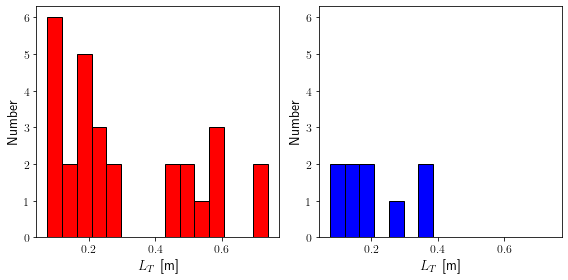

In [48]:
import matplotlib.pyplot as plt


def plot_histograms(data1,data2,nbins,name): 
    
    # Create subplots (2 histograms side by side)
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))  # 1 row, 2 columns
    
    num_bins = nbins
    max_x = max(data1.max(), data2.max()) 
    min_x = max(data1.min(), data2.min()) 
    
    bin_edges = np.linspace(min_x, max_x, num_bins+1)  # Define the bin edges with the same size
    
    
    # Plot the first histogram
    n1, bins1, patches1= axes[0].hist(data1, bins=bin_edges, edgecolor='black', color='red')
    axes[0].set_xlabel(r'$L_T$ [m]', fontsize=14)  #[m$^2$s$^{-1}$]
    axes[0].set_ylabel(r'Number', fontsize=14)
    axes[0].tick_params(axis='both', which='major', labelsize=12)  
    # axes[0].grid(True)
    
    # Plot the second histogram
    n2, bins2, patches2 = axes[1].hist(data2, bins=bin_edges, edgecolor='black', color='blue')
    axes[1].set_xlabel(r'$L_T$ [m]', fontsize=14)  #[m$^2$s$^{-1}$]
    axes[1].set_ylabel(r'Number', fontsize=14)
    axes[1].tick_params(axis='both', which='major', labelsize=12)  
    # axes[1].grid(True)
    
    max_y = max(n1.max(), n2.max())
    
    for i in range(2):
        axes[i].set_ylim(0, max_y * 1.05)
        # axes[i].set_xlim(0, 1.7)

    # Display the histograms side by side
    plt.rcParams['text.usetex'] = True
    
    
    plt.tight_layout()
    plt.savefig(name, dpi=350)
    plt.show()
    return fig

data1 = THORPEEBB['LT_TRUE'] 
data2 = THORPESLACK['LT_TRUE'] 
nbins=15
fig = plot_histograms(data1,data2,nbins,'ForWriting/LTcompared')


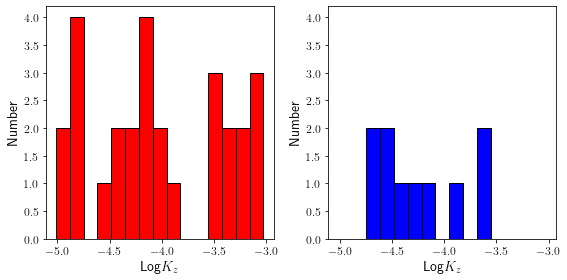

In [47]:
data1 = THORPEEBB['LogK']
data2 = THORPESLACK['LogK']
nbins=15
fig = plot_histograms(data1,data2,nbins,'ForWriting/KCompared')

In [24]:
def density2N(depth, density, rho0=1028):
    """Return the Brunt-Vaisala buoyancy frequency (Nsq) profile
    corresponding to the given density profile.
    The surface Nsq value is set to the value of the 1st calculated value
    below the surface.
    Also return the depths for which the Brunt-Vaisala buoyancy frequencies
    were calculated.
    """
    grav_acc = 9.8  # m / s^2
    Nsq = np.zeros_like(density)
    density_mid = (density[:-1] + density[1:]) / 2
    Nsq[1:] = np.diff(density) * grav_acc / (np.diff(depth) * rho0)
    Nsq[0] = Nsq[1]
    Nsq[Nsq < 0] = 0
    N = np.sqrt(Nsq)
    N_depth = np.zeros_like(depth)
    N_depth[1:] = (depth[:depth.size - 1] + depth[1:]) / 2
    return  N,N_depth

In [366]:
def get_N(data):
    depth = data[["Depth"]].copy()
    density = data[["Sorted Density"]].copy()
    depthmod2_1 = (depth[depth<10]*10//10).dropna()
    depthmod2_2 = (depth[depth>=10]//1).dropna() #get the every 1 meters density difference
    depthmod2 = pd.concat([depthmod2_1,depthmod2_2])

    
    grouped=depthmod2.groupby(by='Depth').indices
    indices = [indices[0] for indices in grouped.values()]
    depth = np.array(depth["Depth"].iloc[indices[:-1]])
    density = np.array(density["Sorted Density"].iloc[indices[:-1]])
    # density = np.convolve(density, np.ones(3)/3, mode='valid')
    # depth = np.convolve(depth, np.ones(3)/3, mode='valid')

    N,Ndepth = density2N(depth,density)
    N = np.convolve(N, np.ones(5)/5, mode='valid')
    Ndepth = np.convolve(Ndepth, np.ones(5)/5, mode='valid')
    
    return N,Ndepth

NsEBB,NdepthEBB=[],[]
for i in range(len(ebb_proc)):
    N,Ndepth = get_N(ebb_proc[i])
    NsEBB.append(N)
    NdepthEBB.append(Ndepth)

NsSLACK,NdepthSLACK=[],[]
for i in range(len(slack_proc)):
    N,Ndepth = get_N(slack_proc[i])
    NsSLACK.append(N)
    NdepthSLACK.append(Ndepth)


# for i in range(len(NsEBB)):
#     depths = NdepthEBB[i]
#     Ns = NsEBB[i]
#     interp = interp1d(depths, Ns, kind='linear', fill_value="extrapolate")
#     ebb_proc[i]["N"] = interp(ebb_proc[i]["Depth"])
#     ebb_proc[i].loc[ebb_proc[i]["N"]<0,"N"] = 0

# for i in range(len(NsSLACK)):
#     depths = NdepthSLACK[i]
#     Ns = NsSLACK[i]
#     interp = interp1d(depths, Ns, kind='linear', fill_value="extrapolate")
#     slack_proc[i]["N"] = interp(slack_proc[i]["Depth"])
#     slack_proc[i].loc[slack_proc[i]["N"]<0,"N"] = 0

In [26]:
allTHORPES = pd.concat([THORPEEBB,THORPESLACK])
unique_stations = allTHORPES.drop_duplicates(subset="StationID")[["StationID","Longitude","Latitude"]].reset_index(drop=True)
unique_stations

,StationID,Longitude,Latitude
0,E2,-125.18389,48.86116
1,E3,-125.17382,48.85899
2,E4,-125.17577,48.86039
3,E5,-125.16484,48.86037
4,E6,-125.16085,48.86145
5,E7,-125.15752,48.86204
6,E8,-125.15197,48.86298
7,S1,-125.18845,48.85622
8,S2,-125.18270,48.85865
9,S3,-125.17481,48.85905


In [377]:
# m = folium.Map(location=[unique_stations["Latitude"].mean(), unique_stations["Longitude"].mean()], zoom_start=12)
# z
# # Data for plotting (station names, latitudes, and longitudes)
# stations = unique_stations.set_index('StationID')[['Latitude', 'Longitude']].apply(list, axis=1).to_dict()

# # Add markers for each station
# for station, coords in stations.items():
#     folium.Marker(
#         location=coords,
#         popup=station,
#         icon=folium.Icon(color="blue", icon="info-sign")
#     ).add_to(m)

# # Display map
# m.save("stations_map.html")


In [378]:
EBB = pd.concat(ebb_proc,axis=0)
SLACK = pd.concat(slack_proc,axis=0)

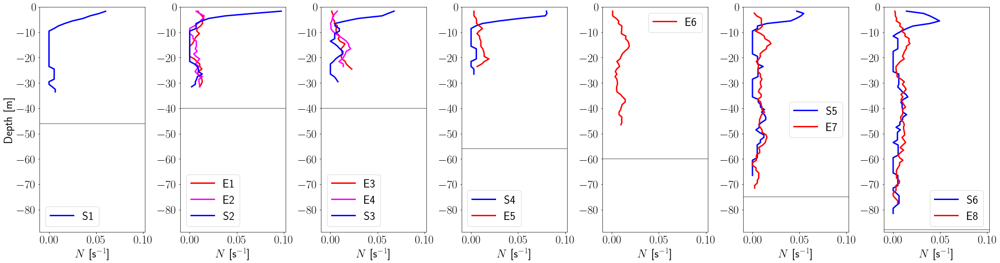

In [367]:
fig,axs = plt.subplots(1,7,figsize = [30,8])#,sharey=True)
depths = [46,40,40,56,60,75,88]
maxdepth = max(depths)
# maxthorpe = max(max(THORPEEBB["LT_TRUE"]),max(THORPESLACK["LT_TRUE"]))
orderslack = [[0],[1],[2],[3],[],[4],[5]]
orderebb = [[],[0,1],[2,3],[4],[5],[6],[7]]
maxs = []
for i in range(7):
    slack_scan = orderslack[i]
    ebb_scan = orderebb[i]
    num = len(slack_scan)+len(ebb_scan)


    if num<2:
        if len(orderslack[i])>0:
            k = orderslack[i][0]
            axs[i].plot(NsSLACK[k],-NdepthSLACK[k],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(NsSLACK[k]))
        else:
            k = orderebb[i][0]
            axs[i].plot(NsEBB[k],-NdepthEBB[k],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(NsEBB[k]))
    elif num>2:
        for j in range(len(orderebb[i])):
            colors=['red','magenta']
            k = orderebb[i][j]
            axs[i].plot(NsEBB[k],-NdepthEBB[k],color=colors[j],label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(NsEBB[k])
        
        k = orderslack[i][0]
        axs[i].plot(NsSLACK[k],-NdepthSLACK[k],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(NsSLACK[k])
        maxs.append(max(maxebb,maxslack))
    else:
        k = orderslack[i][0]
        axs[i].plot(NsSLACK[k],-NdepthSLACK[k],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(NsSLACK[k])
        
        k = orderebb[i][0]
        axs[i].plot(NsEBB[k],-NdepthEBB[k],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(NsEBB[k])
        maxs.append(max(maxebb,maxslack))
        
for i in range(7):
    axs[i].set_ylim([-maxdepth*1.01,0])
    maxN = max(maxs)*1.05
    
    axs[i].axhline(y=-depths[i],color='gray')
    axs[i].set_xlim([-0.01,maxN])
    axs[i].set_xlabel(r'$N$ [s$^{-1}$]',fontsize=25)
    
    axs[i].tick_params(axis='both', which='major', labelsize=25)
    axs[i].legend(fontsize=25)
    
axs[0].set_ylabel('Depth [m]',fontsize=25)
plt.subplots_adjust(hspace=0, wspace=0)
plt.tight_layout()
plt.savefig('ForWriting/FirstNtransect.png',dpi=350)
plt.show()


In [355]:
filtered_SLACK = NsSLACK[1][NdepthSLACK[1] > 10][:len(NsSLACK[1])]
filtered_EBB = NsEBB[0][NdepthEBB[0] > 10][:len(NsSLACK[1])]
filtered_EBB2 = NsEBB[1][NdepthEBB[1] > 10][:len(NsSLACK[1])]

ebb = np.mean([filtered_EBB,filtered_EBB2],axis=0)
mean = np.mean([ebb,filtered_SLACK],axis=0)
result1 = np.std(np.concatenate([ebb, filtered_SLACK]))/mean

In [356]:
filtered_SLACK = NsSLACK[2][NdepthSLACK[2] > 10]
filtered_EBB = NsEBB[2][NdepthEBB[2] > 10]
filtered_EBB2 = NsEBB[3][NdepthEBB[3] > 10]

min_length = min(len(filtered_SLACK), len(filtered_EBB), len(filtered_EBB2))

filtered_SLACK = filtered_SLACK[:min_length]
filtered_EBB = filtered_EBB[:min_length]
filtered_EBB2 = filtered_EBB2[:min_length]

ebb = np.mean([filtered_EBB,filtered_EBB2],axis=0)
mean = np.mean([ebb,filtered_SLACK],axis=0)
result2 = np.std(np.concatenate([ebb, filtered_SLACK]))/mean

In [357]:
filtered_SLACK = NsSLACK[3][NdepthSLACK[3] > 10]
filtered_EBB = NsEBB[4][NdepthEBB[4] > 10]

min_length = min(len(filtered_SLACK), len(filtered_EBB))

filtered_SLACK = filtered_SLACK[:min_length]
filtered_EBB = filtered_EBB[:min_length]
mean = np.mean([filtered_EBB,filtered_SLACK],axis=0)

result3 = np.std(np.concatenate([ebb, filtered_SLACK]))/mean

In [358]:
filtered_SLACK = NsSLACK[4][NdepthSLACK[4] > 10]
filtered_EBB = NsEBB[6][NdepthEBB[6] > 10]

min_length = min(len(filtered_SLACK), len(filtered_EBB))

filtered_SLACK = filtered_SLACK[:min_length]
filtered_EBB = filtered_EBB[:min_length]
mean = np.mean([filtered_EBB,filtered_SLACK],axis=0)

result4 = np.std(np.concatenate([ebb, filtered_SLACK]))/mean

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_52367/2910393593.py:10: RuntimeWarning:

divide by zero encountered in divide



In [359]:
filtered_SLACK = NsSLACK[5][NdepthSLACK[5] > 10]
filtered_EBB = NsEBB[7][NdepthEBB[7] > 10]

min_length = min(len(filtered_SLACK), len(filtered_EBB))

filtered_SLACK = filtered_SLACK[:min_length]
filtered_EBB = filtered_EBB[:min_length]
mean = np.mean([filtered_EBB,filtered_SLACK],axis=0)

result5 = np.std(np.concatenate([ebb, filtered_SLACK]))/mean

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_52367/2538907186.py:10: RuntimeWarning:

divide by zero encountered in divide



In [360]:
allebbs = np.concatenate(NsEBB)
np.mean(allebbs),np.std(allebbs)

(0.00853145089378592, 0.005419426044596614)

In [361]:
NsSLACKsurf = []
for i in range(len(NsSLACK)):
    NsSLACKsurf.append(NsSLACK[i][NdepthSLACK[i]<10])

NsSLACKbelowsurf = []
for i in range(len(NsSLACK)):
    NsSLACKbelowsurf.append(NsSLACK[i][NdepthSLACK[i]>=10])

In [153]:
allslack = np.concatenate(NsSLACK)
np.mean(np.concatenate(NsSLACK)),np.std(np.concatenate(NsSLACK))


(0.012174113730112129, 0.01604199639018738)

In [140]:
np.mean(allslack),np.std(allslack)

(0.03492481517781292, 0.02431928800121654)

In [146]:
THORPEEBB.groupby('StationID')["LT_TRUE"].mean()

StationID
E2    0.165069
E3    0.449390
E4    0.081272
E5    0.371249
E6    0.315438
E7    0.358403
E8    0.239448
Name: LT_TRUE, dtype: float64

In [150]:
ebb_proc[3]["Depth"].max(),ebb_proc[2]["Depth"].max()

(27.252203883220332, 28.75690187822421)

In [152]:
NsSLACK

[array([0.04974537, 0.04534998, 0.03774312, 0.02961712, 0.02203162,
        0.01646375, 0.00920573, 0.00400595, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.00410798, 0.00821614, 0.01231744, 0.0123026 ,
        0.01229588, 0.00819458, 0.00410144, 0.00254308, 0.00606369,
        0.0095844 ]),
 array([0.07267179, 0.05483258, 0.03503203, 0.02049344, 0.01676759,
        0.01500836, 0.0100095 , 0.0050074 , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.00382   ,
        0.00820716, 0.01270367, 0.01337902, 0.01439962, 0.01374678,
        0.01276628, 0.01073146, 0.01026466, 0.00823704]),
 array([0.07653947, 0.06681297, 0.05029157, 0.02937411, 0.01680702,
        0.01241763, 0.01380592, 0.01361917, 0.01204443, 0.01046165,
        0.00697076, 0.00664039, 0.00

In [359]:
# def dmm_to_decimal(degrees, minutes_decimal):
#     """
#     Convert DDD° MM.MMM format to decimal degrees.
    
#     :param degrees: Degrees part (integer)
#     :param minutes_decimal: Minutes and decimal part (float)
    
#     :return: Decimal degrees as a float
#     """
#     # Separate minutes and decimal minutes
#     minutes = int(minutes_decimal)
#     decimal_minutes = minutes_decimal - minutes

#     # Convert to decimal degrees
#     decimal_degrees = degrees + (minutes_decimal)/60
#     return decimal_degrees

In [360]:
# drifting = pd.read_csv('SatellitePassage_Data/boatdrifts.csv')
# drifting["Latitude"] = 0
# drifting["Longitude"] = 0


# for row in range(len(drifting)):
#     drifting["Latitude"].loc[row] = dmm_to_decimal(drifting["LatDeg"].iloc[row], drifting["LatDeci"].iloc[row])
#     drifting["Longitude"].loc[row] = -dmm_to_decimal(drifting["LonDeg"].iloc[row], drifting["LonDeci"].iloc[row])

# # drifting = drifting[['StationID','Latitude','Longitude']]
# drifting

In [361]:
# rangei=[0,41]
# m = folium.Map(location=[drifting["Latitude"].iloc[rangei[0]:rangei[1]].mean(), drifting["Longitude"].iloc[rangei[0]:rangei[1]].mean()], zoom_start=30)

# # Data for plotting (station names, latitudes, and longitudes)
# stations = drifting.iloc[rangei[0]:rangei[1]].set_index('StationID')[['Latitude', 'Longitude']].apply(list, axis=1).to_dict()

# # Add markers for each station
# for station, coords in stations.items():
#     folium.Marker(
#         location=coords,
#         popup=station,
#         icon=folium.Icon(color="blue", icon="info-sign")
#     ).add_to(m)

# # Display map
# m.save("stations_map_drifting.html")

In [202]:
THORPEEBB["LT_TRUE"].max(),THORPEEBB["LT_TRUE"].std(),THORPESLACK["LT_TRUE"].mean(),THORPESLACK["LT_TRUE"].std()

(1.9325121645650691, 0.572588951640374, 0.5156996728106868, 0.8648601035180341)

In [199]:
THORPEEBB["Ko"].mean(),THORPEEBB["Ko"].std(),THORPESLACK["Ko"].mean(),THORPESLACK["Ko"].std()

KeyError: 'Ko'

In [260]:
THORPEEBB.groupby('StationID')["Ko"].max(),THORPEEBB.groupby('StationID')["Ko"].min()

(StationID
 E2    0.000055
 E3    0.000944
 E4    0.000015
 E5    0.000349
 E6    0.000434
 E7    0.000763
 E8    0.000385
 Name: Ko, dtype: float64,
 StationID
 E2    0.000055
 E3    0.000017
 E4    0.000015
 E5    0.000043
 E6    0.000010
 E7    0.000074
 E8    0.000010
 Name: Ko, dtype: float64)

In [261]:
THORPESLACK.groupby('StationID')["Ko"].max(),THORPESLACK.groupby('StationID')["Ko"].min()

(StationID
 S1    0.000022
 S2    0.000232
 S3    0.000035
 S4    0.000029
 S5    0.000141
 S6    0.000220
 Name: Ko, dtype: float64,
 StationID
 S1    0.000022
 S2    0.000232
 S3    0.000035
 S4    0.000029
 S5    0.000028
 S6    0.000004
 Name: Ko, dtype: float64)

In [256]:
THORPESLACK.groupby('StationID')["LT_TRUE"].mean()

StationID
S1    0.059064
S2    0.362822
S3    0.164545
S4    0.185120
S5    0.159169
S6    0.133512
Name: LT_TRUE, dtype: float64

# __VERTICAL DIFFUSIVITY__

In [254]:
def K_Shih(LT,N):
    nu = 1.4e-6
    return 1.6*np.sqrt(nu)*LT*np.sqrt(N)

def K_Osb(LT,N):
    return 0.128*LT**2*N


def get_dissipation_rate(LT,N):
    return (1.08**2)*(LT**2)*(N**3)
    

In [255]:
idx_stations = dict({'E1':0,'E2':1,'E3':2,'E4':3,'E5':4,'E6':5,'E7':6,'E8':7,'S1':0,'S2':1,'S3':2,'S4':3,'S5':4,'S6':5})
THORPEEBB["N"]=np.nan
THORPEEBB["Ks"]=np.nan
THORPEEBB["Ko"]=np.nan
THORPEEBB["eps"]=np.nan
eps = []

for i in range(len(THORPEEBB)):
    station = THORPEEBB["StationID"].iloc[i]
    idx = idx_stations[station]
    if station.split()[0][0] == 'S':
        Ns,Nd = NsSLACK[idx],NdepthSLACK[idx]
    else:
        Ns,Nd = NsEBB[idx],NdepthEBB[idx]
    
    maxd = THORPEEBB.iloc[i]["Depth max"]
    mind = THORPEEBB.iloc[i]["Depth min"]
    meand = THORPEEBB.iloc[i]["Depth mean"]
    i_tokeep = None
    for j in range(len(Nd)):
        if (Nd[j] <= maxd) and (Nd[j] >= mind):
            i_tokeep = j
    if i_tokeep is None:
        i_tokeep = min(range(len(Nd)), key=lambda j: abs(Nd[j] - meand))

    THORPEEBB["N"].values[i] = Ns[i_tokeep]
    THORPEEBB["Ks"].values[i] = K_Shih(THORPEEBB["LT_TRUE"].iloc[i],THORPEEBB["N"].iloc[i])
    THORPEEBB["Ko"].values[i] = K_Osb(THORPEEBB["LT_TRUE"].iloc[i],THORPEEBB["N"].iloc[i])
    THORPEEBB["eps"].values[i] = get_dissipation_rate(THORPEEBB["LT_TRUE"].iloc[i],THORPEEBB["N"].iloc[i])

    
THORPEEBB["LogK"] = np.log10(THORPEEBB["Ko"])

THORPESLACK["N"]=np.nan
THORPESLACK["Ks"]=np.nan
THORPESLACK["Ko"]=np.nan
THORPESLACK["eps"]=np.nan

for i in range(len(THORPESLACK)):
    station = THORPESLACK["StationID"].iloc[i]
    idx = idx_stations[station]
    if station.split()[0][0] == 'S':
        Ns,Nd = NsSLACK[idx],NdepthSLACK[idx]
    else:
        Ns,Nd = NsEBB[idx],NdepthEBB[idx]
    
    maxd = THORPESLACK.iloc[i]["Depth max"]
    mind = THORPESLACK.iloc[i]["Depth min"]
    meand = THORPESLACK.iloc[i]["Depth mean"]
    i_tokeep = None
    for j in range(len(Nd)):
        if (Nd[j] <= maxd) and (Nd[j] >= mind):
            i_tokeep = j
    if i_tokeep is None:
        i_tokeep = min(range(len(Nd)), key=lambda j: abs(Nd[j] - meand))

    THORPESLACK["N"].values[i] = Ns[i_tokeep]
    THORPESLACK["Ks"].values[i] = K_Shih(THORPESLACK["LT_TRUE"].iloc[i],THORPESLACK["N"].iloc[i])
    THORPESLACK["Ko"].values[i] = K_Osb(THORPESLACK["LT_TRUE"].iloc[i],THORPESLACK["N"].iloc[i])
    THORPESLACK["eps"].values[i] = get_dissipation_rate(THORPESLACK["LT_TRUE"].iloc[i],THORPESLACK["N"].iloc[i])

    
THORPESLACK["LogK"] = np.log10(THORPESLACK["Ko"])

In [250]:
THORPEEBB["LT_TRUE"].max(),THORPEEBB["Ko"].std(),THORPESLACK["Ko"].mean(),THORPESLACK["Ko"].std()

(0.7390541019289288,
 0.0002913593462583804,
 6.632124239440948e-05,
 7.912009380810751e-05)

In [248]:
THORPEEBB

,LT_TRUE,Depth min,Depth mean,Depth max,StationID,Longitude,Latitude,N,Ks,Ko,eps,LogK
0,0.165069,4.064645,4.275621,4.417247,E2,-125.18389,48.86116,0.015772,0.000039,0.000055,1.246870e-07,-4.259580
1,0.090582,21.539898,21.614297,21.685900,E3,-125.17382,48.85899,0.015741,0.000022,0.000017,3.732593e-08,-4.781679
2,0.508886,23.096351,23.671774,24.208298,E3,-125.17382,48.85899,0.020389,0.000138,0.000676,2.560035e-06,-3.170163
3,0.596530,25.128874,25.909877,26.633411,E3,-125.17382,48.85899,0.020389,0.000161,0.000929,3.517781e-06,-3.032140
4,0.601560,26.989278,27.915230,28.664495,E3,-125.17382,48.85899,0.020389,0.000163,0.000944,3.577354e-06,-3.024847
5,0.081272,18.493056,18.562824,18.652432,E4,-125.17577,48.86039,0.018267,0.000021,0.000015,4.695946e-08,-4.811240
6,0.133078,19.666236,19.795596,19.935818,E5,-125.16484,48.86037,0.019092,0.000035,0.000043,1.437496e-07,-4.363729
7,0.260531,6.421032,6.716214,7.098851,E5,-125.16484,48.86037,0.010146,0.000050,0.000088,8.270130e-08,-4.054756
8,0.720139,0.622386,1.369955,2.143783,E5,-125.16484,48.86037,0.005253,0.000099,0.000349,8.767479e-08,-3.457559
9,0.079353,50.328171,50.444441,50.503627,E6,-125.16085,48.86145,0.012003,0.000016,0.000010,1.269988e-08,-5.014391


In [306]:
E8=THORPEEBB["StationID"]=='E8'
THORPEEBB[E8]
eps8 = []
ks8 = []
depths_eps8 = []
depths_eps8.append(0)
eps8.append(0)
  
for i in range(len(THORPEEBB[E8])):
    if i<len(THORPEEBB[E8])-1:
        for j in range(10):
            if i==0:
                start = 0
            else:
                start = THORPEEBB[E8]["Depth min"].iloc[i+1]
            ranged = (THORPEEBB[E8]["Depth max"].iloc[i]-start)/10

            depths_eps7.append(start+ranged*j)
            eps7.append(0)
    depths_eps8.append(THORPEEBB[E8]["Depth min"].iloc[i])
    
    eps8.append(THORPEEBB[E8]["eps"].iloc[i])
    ks8.append(THORPEEBB[E8]["Ks"].iloc[i])
    depths_eps8.append(THORPEEBB[E8]["Depth max"].iloc[i])
    eps8.append(THORPEEBB[E8]["eps"].iloc[i])
    ks8.append(THORPEEBB[E8]["Ks"].iloc[i])

    

# depths = np.linspace(THORPEEBB[E8]["Depth min"].min(),THORPEEBB[E8]["Depth max"].max(),1000)
# eps = np.ones(len(depths))*1e-10


In [305]:
E7=THORPEEBB["StationID"]=='E7'
THORPEEBB[E7]
eps7 = []
ks7 = []
depths_eps7 = []

  
for i in range(len(THORPEEBB[E7])):
    if i<len(THORPEEBB[E7])-1:
        for j in range(10):
            if i==0:
                start = 0
            else:
                start = THORPEEBB[E7]["Depth min"].iloc[i+1]
            ranged = (THORPEEBB[E7]["Depth max"].iloc[i]-start)/10

            depths_eps7.append(start+ranged*j)
            eps7.append(0)
    
    depths_eps7.append(THORPEEBB[E7]["Depth min"].iloc[i])
    
    eps7.append(THORPEEBB[E7]["eps"].iloc[i])
    ks7.append(THORPEEBB[E7]["Ks"].iloc[i])
    depths_eps7.append(THORPEEBB[E7]["Depth max"].iloc[i])
    eps7.append(THORPEEBB[E7]["eps"].iloc[i])
    ks7.append(THORPEEBB[E7]["Ks"].iloc[i])


            
# depths = np.linspace(THORPEEBB[E8]["Depth min"].min(),THORPEEBB[E8]["Depth max"].max(),1000)
# eps = np.ones(len(depths))*1e-10
depths_eps7

[0.0,
 5.300602211245724,
 10.601204422491447,
 15.90180663373717,
 21.202408844982894,
 26.50301105622862,
 31.80361326747434,
 37.104215478720064,
 42.40481768996579,
 47.70541990121151,
 52.622005662734026,
 53.00602211245724,
 46.05314682185338,
 45.569430506863945,
 45.08571419187451,
 44.60199787688507,
 44.118281561895635,
 43.63456524690619,
 43.150848931916755,
 42.66713261692732,
 42.18341630193788,
 41.699699986948445,
 40.81175430784915,
 41.21598367195901,
 39.44349767428708,
 40.18765236470047,
 40.931807055113865,
 41.67596174552725,
 42.42011643594065,
 43.16427112635404,
 43.90842581676743,
 44.65258050718082,
 45.39673519759421,
 46.14088988800761,
 46.05314682185338,
 46.885044578420995,
 14.42521739728257,
 16.987739055010195,
 19.550260712737824,
 22.11278237046545,
 24.675304028193075,
 27.2378256859207,
 29.800347343648326,
 32.362869001375955,
 34.925390659103584,
 37.487912316831206,
 39.44349767428708,
 40.050433974558835,
 48.82973869269182,
 45.4946133116538

In [314]:
Ns = NsEBB[7]
depths = NdepthEBB[7]
interp_functionN8 = interp1d(depths, Ns, kind='linear', fill_value="extrapolate")
interp_functionEps8 = interp1d(depths_eps8, eps8, kind='linear', fill_value="extrapolate")
# interp_functionKs8 = interp1d(depths_eps8, ks8, kind='linear', fill_value="extrapolate")


interpolated_epsE8 = interp_functionEps8(ebb_proc[7]["Depth"])
interpolated_KsE8 = interp_functionKs8(ebb_proc[7]["Depth"])
interpolated_NsE8 = interp_functionN8(ebb_proc[7]["Depth"])


Ns = NsEBB[6]
depths = NdepthEBB[6]
interp_functionN7 = interp1d(depths, Ns, kind='linear', fill_value="extrapolate")
interp_functionEps7 = interp1d(depths_eps7, eps7, kind='linear', fill_value="extrapolate")
# interp_functionKs7 = interp1d(depths_eps7, ks7, kind='linear', fill_value="extrapolate")


interpolated_epsE7 = interp_functionEps7(ebb_proc[6]["Depth"])
interpolated_KsE7 = interp_functionKs7(ebb_proc[6]["Depth"])
interpolated_NsE7 = interp_functionN7(ebb_proc[6]["Depth"])



depths_eps7
# interpolated_N = interp_function(ebb_proc[7]["Depth"])

[0.0,
 5.300602211245724,
 10.601204422491447,
 15.90180663373717,
 21.202408844982894,
 26.50301105622862,
 31.80361326747434,
 37.104215478720064,
 42.40481768996579,
 47.70541990121151,
 52.622005662734026,
 53.00602211245724,
 46.05314682185338,
 45.569430506863945,
 45.08571419187451,
 44.60199787688507,
 44.118281561895635,
 43.63456524690619,
 43.150848931916755,
 42.66713261692732,
 42.18341630193788,
 41.699699986948445,
 40.81175430784915,
 41.21598367195901,
 39.44349767428708,
 40.18765236470047,
 40.931807055113865,
 41.67596174552725,
 42.42011643594065,
 43.16427112635404,
 43.90842581676743,
 44.65258050718082,
 45.39673519759421,
 46.14088988800761,
 46.05314682185338,
 46.885044578420995,
 14.42521739728257,
 16.987739055010195,
 19.550260712737824,
 22.11278237046545,
 24.675304028193075,
 27.2378256859207,
 29.800347343648326,
 32.362869001375955,
 34.925390659103584,
 37.487912316831206,
 39.44349767428708,
 40.050433974558835,
 48.82973869269182,
 45.4946133116538

In [308]:
eps = np.mean([interpolated_epsE7,interpolated_epsE8[:len(interpolated_epsE7)]],axis=0)
Ns = np.mean([interpolated_NsE7,interpolated_NsE8[:len(interpolated_NsE7)]],axis=0)
len(Ns),len(eps)

(3444, 3444)

In [247]:
interpolated_eps

array([4.37932071e-07, 4.37932071e-07, 4.37932071e-07, ...,
       1.59434596e-07, 1.59434596e-07, 1.59434596e-07])

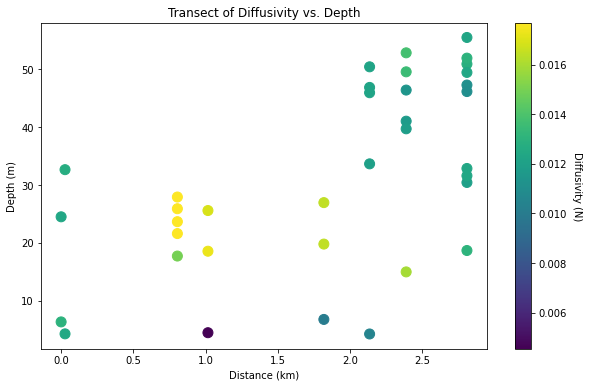

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from geopy.distance import geodesic

# Sample DataFrame
data = THORPEEBB
# Calculate distances between consecutive points (using geodesic distance)
def calculate_distances(latitudes, longitudes):
    distances = [0]  # Start with the first point as the origin
    for i in range(1, len(latitudes)):
        distance = geodesic((latitudes[i-1], longitudes[i-1]), (latitudes[i], longitudes[i])).km
        distances.append(distances[-1] + distance)
    return distances

# Calculate the distances between each station
distances = calculate_distances(data['Latitude'], data['Longitude'])

# Use the mean depth for the y-axis
depths = data['Depth mean']

# Use the N column (or whichever column represents diffusivity) for the color
diffusivity = data['N']

# Create a plot
plt.figure(figsize=(10, 6))

# Scatter plot of distance vs depth, with color representing diffusivity
scatter = plt.scatter(distances, depths, c=diffusivity, cmap='viridis', s=100)

# Add colorbar to show diffusivity values
cbar = plt.colorbar(scatter)
cbar.set_label('Diffusivity (N)', rotation=270, labelpad=15)

# Set labels and title
plt.xlabel('Distance (km)')
plt.ylabel('Depth (m)')
plt.title('Transect of Diffusivity vs. Depth')

# Show the plot
plt.show()


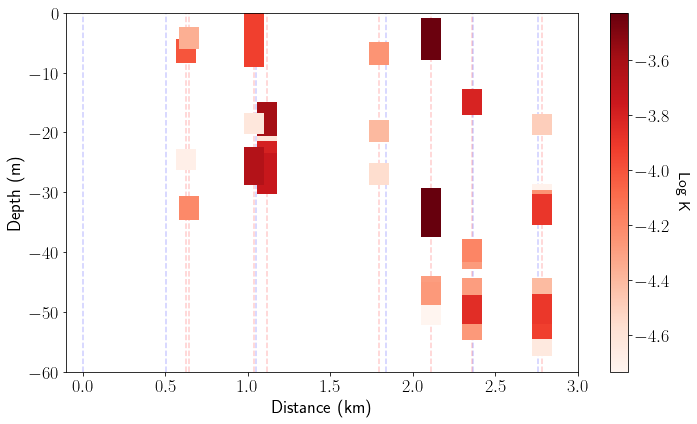

In [150]:
# Sample DataFrame (replace THORPEEBB with your actual DataFrame)
data = THORPEEBB

# Calculate distances between consecutive points (using geodesic distance)
def calculate_distances(latitudes, longitudes,lati,longi):
    distances = [geodesic((lati, longi), (latitudes[0], longitudes[0])).km]  # Start with the first point as the origin
    for i in range(1, len(latitudes)):
        distance = geodesic((lati, longi), (latitudes[i], longitudes[i])).km
        distances.append(distance)
    return distances

# Calculate the distances between each station
distancesEBB = calculate_distances(data['Latitude'], data['Longitude'],THORPESLACK['Latitude'].iloc[0],THORPESLACK['Longitude'].iloc[0])

# Use Depth min and Depth max for y-axis (plotting full range of depth for each station)
depth_min = -data['Depth min']  # Negate to show depth going downward
depth_max = -data['Depth max']  # Same for max depth

# Use the LogK column (or whichever column represents diffusivity) for the color
diffusivity = data['LogK']

# Normalize diffusivity values for proper colormap scaling
norm1 = plt.Normalize(vmin=diffusivity.min(), vmax=diffusivity.max())  # Normalizing diffusivity

# Create a plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each station's depth range (from Depth min to Depth max) with color representing diffusivity
for i in range(len(data)):
    ax.plot([distancesEBB[i], distancesEBB[i]], [depth_min[i], depth_max[i]], 
             color=plt.cm.Reds(norm1(diffusivity[i])), linewidth=20)


# Create a ScalarMappable object for the colorbar (link it to the color values)
sm = plt.cm.ScalarMappable(cmap='Reds', norm=norm1)
sm.set_array([])  # We don't need any data, just the colormap

for i in range(len(np.unique(distancesEBB))):
        ax.axvline(x=np.unique(distancesEBB)[i],linestyle='--',color='red',alpha=0.2,zorder=1)
    
for i in range(len(np.unique(distancesSLACK))):
    if i==0:
        ax.axvline(x=0,linestyle='--',color='blue',alpha=0.2,zorder=1)
    else:
        ax.axvline(x=np.unique(distancesSLACK)[i],linestyle='--',color='blue',alpha=0.2,zorder=1)
        
# Add colorbar
cbar = fig.colorbar(sm, ax=ax)
cbar.ax.tick_params(labelsize=18)
cbar.set_label('Log K', rotation=270, labelpad=20,fontsize=16)
cbar.ax.yaxis.set_label_position('right')

# Set labels and title
ax.set_xlabel('Distance (km)',fontsize=18)
ax.set_ylabel('Depth (m)',fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)
ax.set_xlim(-0.1,3)
ax.set_ylim(-60,0)
# ax.grid()
# Show the plot
plt.tight_layout()

plt.savefig('ForWriting/DiffusivityEBB.png',dpi=350)

In [161]:
depths
np.unique(distancesEBB),np.unique(distancesSLACK)

distances = [0,0.56202,

(array([0.62298844, 0.64324226, 1.03960608, 1.11687237, 1.79289801,
        2.10710254, 2.36006142, 2.78036139]),
 array([0.        , 0.50105584, 1.04921698, 1.83948373, 2.36596338,
        2.76156916]))

In [162]:
np.mean([1.03960608,0.50105584])

0.5620221400000001

In [159]:
len(np.unique(distancesSLACK)),len(np.unique(distancesEBB[0,2,4,5,6,7]))

TypeError: list indices must be integers or slices, not tuple

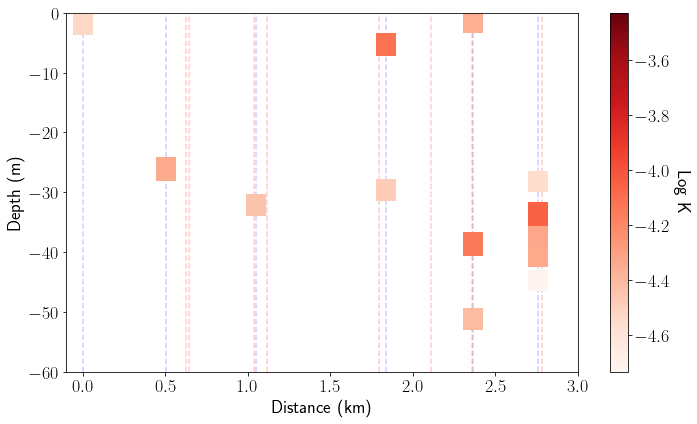

In [151]:
# Sample DataFrame (replace THORPEEBB with your actual DataFrame)
data = THORPESLACK

distancesSLACK = calculate_distances(data['Latitude'], data['Longitude'],THORPESLACK['Latitude'].iloc[0],THORPESLACK['Longitude'].iloc[0])

# Use Depth min and Depth max for y-axis (plotting full range of depth for each station)
depth_min = -data['Depth min']  # Negate to show depth going downward
depth_max = -data['Depth max']  # Same for max depth

# Use the LogK column (or whichever column represents diffusivity) for the color
diffusivity = data['LogK']

# Normalize diffusivity values for proper colormap scaling
norm = plt.Normalize(vmin=diffusivity.min(), vmax=diffusivity.max())  # Normalizing diffusivity

# Create a plot
fig, ax = plt.subplots(figsize=(10, 6))

# Plot each station's depth range (from Depth min to Depth max) with color representing diffusivity
for i in range(len(data)):
    ax.plot([distancesSLACK[i], distancesSLACK[i]], [depth_min[i], depth_max[i]], 
             color=plt.cm.Reds(norm1(diffusivity[i])), linewidth=20)

# Create a ScalarMappable object for the colorbar (link it to the color values)
sm = plt.cm.ScalarMappable(cmap='Reds', norm=norm1)
sm.set_array([])  # We don't need any data, just the colormap

# Add colorbar
cbar = fig.colorbar(sm, ax=ax)
cbar.ax.tick_params(labelsize=18)
cbar.set_label('Log K', rotation=270, labelpad=20,fontsize=18)
cbar.ax.yaxis.set_label_position('right')

# Set labels and title
ax.set_xlabel('Distance (km)',fontsize=18)
ax.set_ylabel('Depth (m)',fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

stations = ['R1','R2','R3','R4','R5','R6','R7']
for i in range(len(np.unique(distancesSLACK))):
    if i==0:
        ax.axvline(x=0,linestyle='--',color='blue',alpha=0.2,zorder=1)
    else:
        ax.axvline(x=np.unique(distancesSLACK)[i],linestyle='--',color='blue',alpha=0.2,zorder=1)

for i in range(len(np.unique(distancesEBB))):
        ax.axvline(x=np.unique(distancesEBB)[i],linestyle='--',color='red',alpha=0.2,zorder=1)

ax.set_xlim(-0.1,3)
ax.set_ylim(-60,0)
# ax.grid()
# Show the plot
plt.tight_layout()
plt.savefig('ForWriting/DiffusivitySLACK.png',dpi=350)


In [152]:
THORPESLACK["StationID"].unique()

array(['S1', 'S2', 'S3', 'S4', 'S5', 'S6'], dtype=object)

array([0.        , 0.50105584, 1.08171727, 1.87384742, 2.40495048,
       2.86718689])

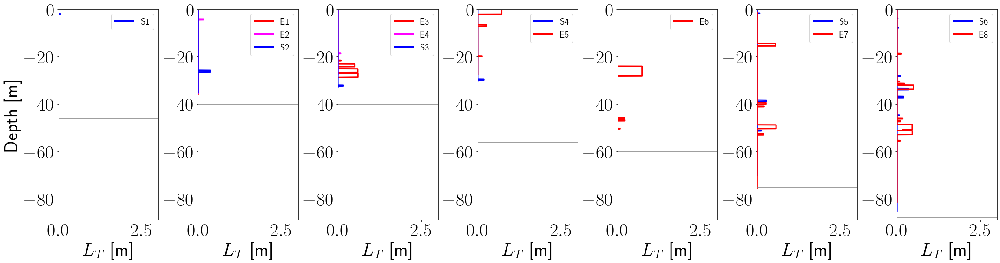

In [308]:
fig,axs = plt.subplots(1,7,figsize = [30,8])#,sharey=True)
depths = [46,40,40,56,60,75,88]
maxdepth = max(depths)
orderslack = [[0],[1],[2],[3],[],[4],[5]]
orderebb = [[],[0,1],[2,3],[4],[5],[6],[7]]
maxs = []


for i in range(7):
    slack_scan = orderslack[i]
    ebb_scan = orderebb[i]
    num = len(slack_scan)+len(ebb_scan)
    param = "LT_TRUE"
    data_ebb = ebb_proc
    data_slack = slack_proc


    if num<2:
        if len(orderslack[i])>0:
            k = orderslack[i][0]
            axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_slack[k][param]))
        else:
            k = orderebb[i][0]
            axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_ebb[k][param]))
    elif num>2:
        for j in range(len(orderebb[i])):
            colors=['red','magenta']
            k = orderebb[i][j]
            axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color=colors[j],label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        
        k = orderslack[i][0]
        axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        maxs.append(max(maxebb,maxslack))
    else:
        k = orderslack[i][0]
        axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        
        k = orderebb[i][0]
        axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        maxs.append(max(maxebb,maxslack))
        
for i in range(7):
    axs[i].set_ylim([-maxdepth*1.01,0])
    # maxN = np.max(maxs[i])*1.05
    
    axs[i].axhline(y=-depths[i],color='gray')
    axs[i].set_xlim([0,3])
    axs[i].set_xlabel(r'$L_T$ [m]',fontsize=40)
    
    axs[i].tick_params(axis='both', which='major', labelsize=40)
    axs[i].legend(fontsize=20)
    
axs[0].set_ylabel('Depth [m]',fontsize=40)
plt.subplots_adjust(hspace=0, wspace=0)
plt.tight_layout()
plt.savefig('ForWriting/LTtransectdiffbase.png',dpi=350)
plt.show()


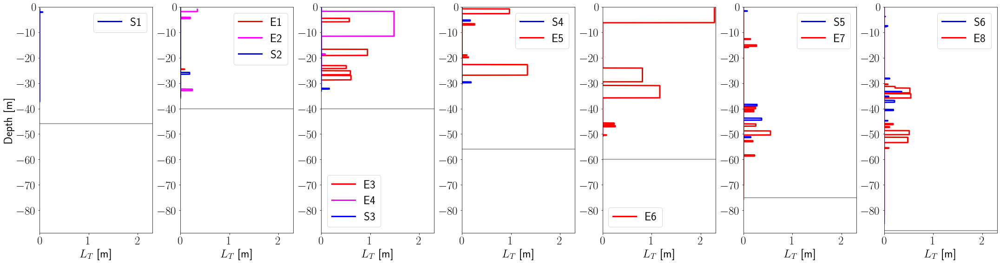

In [167]:
fig,axs = plt.subplots(1,7,figsize = [30,8])#,sharey=True)
depths = [46,40,40,56,60,75,88]
maxdepth = max(depths)
orderslack = [[0],[1],[2],[3],[],[4],[5]]
orderebb = [[],[0,1],[2,3],[4],[5],[6],[7]]
maxs = []


for i in range(7):
    slack_scan = orderslack[i]
    ebb_scan = orderebb[i]
    num = len(slack_scan)+len(ebb_scan)
    param = "LT_TRUE"
    data_ebb = ebb_proc
    data_slack = slack_proc


    if num<2:
        if len(orderslack[i])>0:
            k = orderslack[i][0]
            axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_slack[k][param]))
        else:
            k = orderebb[i][0]
            axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_ebb[k][param]))
    elif num>2:
        for j in range(len(orderebb[i])):
            colors=['red','magenta']
            k = orderebb[i][j]
            axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color=colors[j],label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        
        k = orderslack[i][0]
        axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        maxs.append(max(maxebb,maxslack))
    else:
        k = orderslack[i][0]
        axs[i].plot(data_slack[k][param],-data_slack[k]["Depth"],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        
        k = orderebb[i][0]
        axs[i].plot(data_ebb[k][param],-data_ebb[k]["Depth"],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        maxs.append(max(maxebb,maxslack))
        
maxN = max(maxs)*1.01        
for i in range(7):
    axs[i].set_ylim([-maxdepth*1.01,0])

    axs[i].axhline(y=-depths[i],color='gray')
    axs[i].set_xlim([0,maxN])
    axs[i].set_xlabel(r'$L_T$ [m]',fontsize=25)
    
    axs[i].tick_params(axis='both', which='major', labelsize=25)
    axs[i].legend(fontsize=25)
    
axs[0].set_ylabel('Depth [m]',fontsize=25)
plt.subplots_adjust(hspace=0, wspace=0)
plt.tight_layout()
# plt.savefig('ForWriting/Lttransect.png',dpi=350)
plt.show()


In [1439]:
THORPEEBB

,LT_TRUE,Depth min,Depth mean,Depth max,StationID,Longitude,Latitude,N,Ks,Ko,LogK
0,0.091809,24.413793,24.508050,24.590355,E1,-125.18383,48.86092,0.012372,0.000022,0.000118,-4.659149
1,0.364681,6.025563,6.346473,6.784793,E1,-125.18383,48.86092,0.012976,0.000089,0.001947,-4.049756
2,0.166124,4.062692,4.274858,4.422977,E2,-125.18389,48.86116,0.012430,0.000040,0.000387,-4.400577
3,0.243342,32.346500,32.661778,32.903931,E2,-125.18389,48.86116,0.012749,0.000059,0.000852,-4.229286
4,0.083371,21.540296,21.611406,21.676896,E3,-125.17382,48.85899,0.017661,0.000024,0.000138,-4.623715
5,0.522731,23.094823,23.671815,24.227233,E3,-125.17382,48.85899,0.017661,0.000149,0.005444,-3.826453
6,0.599759,27.021417,27.934596,28.679302,E3,-125.17382,48.85899,0.017661,0.000171,0.007166,-3.766754
7,0.601261,25.135414,25.913636,26.624734,E3,-125.17382,48.85899,0.017661,0.000172,0.007202,-3.765667
8,0.981387,16.679002,17.728520,18.942527,E3,-125.17382,48.85899,0.014947,0.000258,0.016238,-3.589132
9,0.099917,18.493863,18.584021,18.674223,E4,-125.17577,48.86039,0.017289,0.000028,0.000195,-4.549725


In [140]:
for i in range(len(ebb_proc)):
    ebb_proc[i]["LogK"] = 0
    thorpies = ebb_proc[i]["LT_TRUE"][ebb_proc[i]['LT_TRUE']>0]
    thorpes = THORPEEBB['LT_TRUE'][THORPEEBB['StationID']==ebb_proc[i]['StationID'][0]]
    
    for idx in thorpies.index:
        indice = min(range(len(thorpes)), key=lambda k: abs(thorpes.iloc[k] - thorpies.loc[idx]))
        ebb_proc[i].loc[idx,"LogK"] = THORPEEBB["LogK"].iloc[indice]

for i in range(len(slack_proc)):
    slack_proc[i]["LogK"] = 0
    thorpies = slack_proc[i]["LT_TRUE"][slack_proc[i]['LT_TRUE']>0]
    thorpes = THORPESLACK['LT_TRUE'][THORPESLACK['StationID']==slack_proc[i]['StationID'][0]]
    
    for idx in thorpies.index:
        indice = min(range(len(thorpes)), key=lambda k: abs(thorpes.iloc[k] - thorpies.loc[idx]))
        slack_proc[i].loc[idx,"LogK"] = THORPESLACK["LogK"].iloc[indice]

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_86813/4202895013.py:8: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-4.040874706210595' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_86813/4202895013.py:8: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-4.690363059234891' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_86813/4202895013.py:8: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-4.5873221099673955' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.

/var/folders/0q/ylrzgj790xx8_v0hq__m6kbw0000gn/T/ipykernel_86813/4202895

In [1475]:
ebb_proc[0]["LogK"]<0

,StationID,Longitude,Latitude,Pressure,Temperature,Conductivity,Oxygen,Depth,PressureFilt,Flag,...,Sorted Depth,Sample Displacements,Depth DisplacementsSPEED,Depth Displacements,LT,Ro_Ratio,LTSPEED,LT_TRUE,Log,LogK
0,E1,-125.18383,48.86092,0.53055,7.646,31.742,7.475817,0.555690,0.564529,0,...,0.555690,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
1,E1,-125.18383,48.86092,0.57858,7.652,31.740,7.475817,0.561008,0.571030,0,...,0.561008,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
2,E1,-125.18383,48.86092,0.54445,7.647,31.743,7.475817,0.567206,0.574291,0,...,0.567206,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
3,E1,-125.18383,48.86092,0.58907,7.642,31.743,7.475817,0.574300,0.576127,0,...,0.574300,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
4,E1,-125.18383,48.86092,0.58044,7.649,31.742,7.475817,0.581785,0.580853,0,...,0.581785,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1721,E1,-125.18383,48.86092,35.68331,7.790,32.505,7.145768,35.404384,35.683143,0,...,35.404384,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
1722,E1,-125.18383,48.86092,35.70696,7.798,32.508,7.146216,35.433596,35.719327,0,...,35.433596,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
1723,E1,-125.18383,48.86092,35.77258,7.793,32.509,7.146216,35.465287,35.757601,0,...,35.465287,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0
1724,E1,-125.18383,48.86092,35.81290,7.800,32.509,7.146216,35.497547,35.795218,0,...,35.497547,0,NaN,0.0,0.0,0.0,0.0,0.0,0,0.0


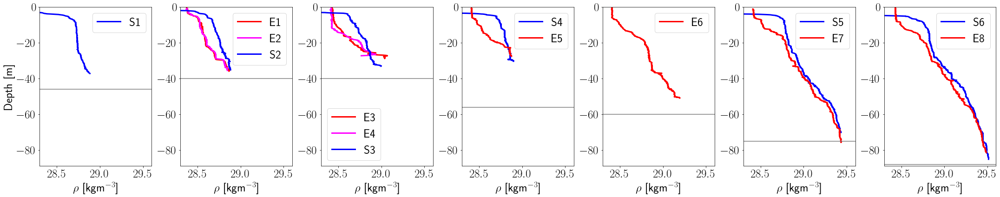

In [420]:
fig,axs = plt.subplots(1,7,figsize = [30,6])#,sharey=True)
depths = [46,40,40,56,60,75,88]
maxdepth = max(depths)
orderslack = [[0],[1],[2],[3],[],[4],[5]]
orderebb = [[],[0,1],[2,3],[4],[5],[6],[7]]
maxs = []
mins = []

for i in range(7):
    slack_scan = orderslack[i]
    ebb_scan = orderebb[i]
    num = len(slack_scan)+len(ebb_scan)
    param = "pot_density_anomaly"
    data_ebb = ebb_proc
    data_slack = slack_proc
    depth=0



    if num<2:
        if len(orderslack[i])>0:
            k = orderslack[i][0]
            
            cond_slack = data_slack[k]["Depth"]>depth
            axs[i].plot(data_slack[k][param][cond_slack],-data_slack[k]["Depth"][cond_slack],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_slack[k][param]))
            mins.append(min(data_slack[k][param]))
        else:
            k = orderebb[i][0]
            cond_ebb = data_ebb[k]["Depth"]>depth
            axs[i].plot(data_ebb[k][param][cond_ebb],-data_ebb[k]["Depth"][cond_ebb],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
            maxs.append(max(data_ebb[k][param]))
            mins.append(min(data_ebb[k][param]))
    elif num>2:
        for j in range(len(orderebb[i])):
            colors=['red','magenta']
            k = orderebb[i][j]
            cond_ebb = data_ebb[k]["Depth"]>depth
            axs[i].plot(data_ebb[k][param][cond_ebb],-data_ebb[k]["Depth"][cond_ebb],color=colors[j],label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        minebb = min(data_slack[k][param])
        
        k = orderslack[i][0]
        cond_slack = data_slack[k]["Depth"]>depth
        axs[i].plot(data_slack[k][param][cond_slack],-data_slack[k]["Depth"][cond_slack],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        minslack = min(data_slack[k][param])
        maxs.append(max(maxebb,maxslack))
        mins.append(min(minebb,minslack))
    else:
        k = orderslack[i][0]
        cond_slack = data_slack[k]["Depth"]>depth
        axs[i].plot(data_slack[k][param][cond_slack],-data_slack[k]["Depth"][cond_slack],color='blue',label=slack_proc[k]['StationID'].iloc[0],linewidth=3)
        maxslack = max(data_slack[k][param])
        minslack = min(data_slack[k][param])
        
        k = orderebb[i][0]
        cond_ebb = data_ebb[k]["Depth"]>depth
        axs[i].plot(data_ebb[k][param][cond_ebb],-data_ebb[k]["Depth"][cond_ebb],color='red',label=ebb_proc[k]['StationID'].iloc[0],linewidth=3)
        maxebb = max(data_ebb[k][param])
        minslack = min(data_ebb[k][param])
        
        maxs.append(max(maxebb,maxslack))
        mins.append(min(minebb,minslack))
        
maxN = max(maxs)*1.01     
minN = min(mins)*1.01    
for i in range(7):
    axs[i].set_ylim([-maxdepth*1.01,0])
    # axs[i].set_ylim([-5,0])
    # axs[i].axhline(y=-depths[i],color='
    axs[i].axhline(y=-depths[i],color='gray')
    axs[i].set_xlim([28.3,29.6])
    axs[i].set_xlabel(r'$\rho$ [kgm$^{-3}$]',fontsize=25)
    
    axs[i].tick_params(axis='both', which='major', labelsize=25)
    axs[i].legend(fontsize=25)
    
axs[0].set_ylabel('Depth [m]',fontsize=25)
plt.subplots_adjust(hspace=0, wspace=0)
plt.tight_layout()
plt.savefig('ForWriting/rhoSLACKcomp.png',dpi=350)
plt.show()


In [326]:
ebb_proc[0].keys()

Index(['StationID', 'Longitude', 'Latitude', 'Pressure', 'Temperature',
       'Conductivity', 'Oxygen', 'Depth', 'PressureFilt', 'Flag', 'PressureLF',
       'Sample', 'Temperature_filt', 'Temperature_aligned',
       'Conductivity_filt', 'Conductivity_aligned', 'salinity', 'abs_salinity',
       'conservative_t', 'pot_density_anomaly', 'Fall Speed', 'Fall Speed Raw',
       'Top Bottom Density', 'Bottom Top Density', 'Intermediate', 'rank',
       'Sorted Density', 'Sorted Sample', 'Sorted Depth',
       'Sample Displacements', 'Depth DisplacementsSPEED',
       'Depth Displacements', 'LT', 'Ro_Ratio', 'LTSPEED', 'LT_TRUE'],
      dtype='object')

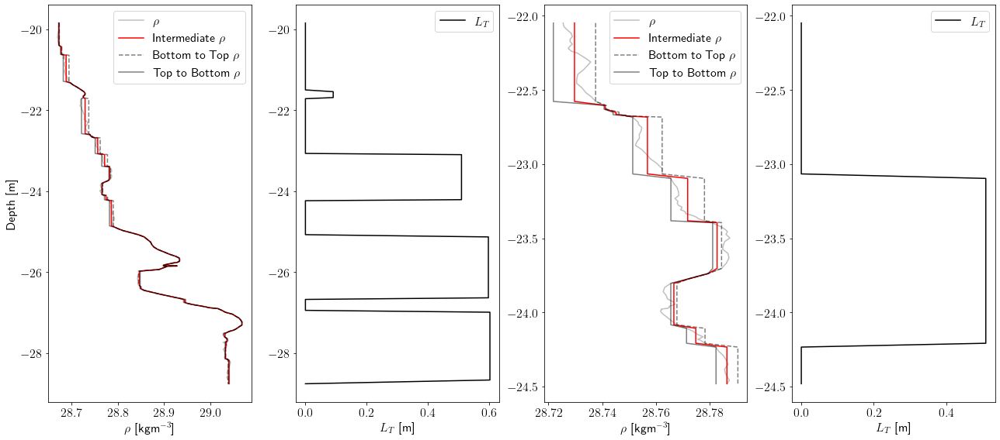

In [44]:
ebb=ebb_proc[2].copy()
i1,i2=1000,2000
ii1,ii2 = 1080,1200


fig,ax = plt.subplots(1,4,figsize=[18,8])
ax[0].plot(ebb["pot_density_anomaly"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='gray',alpha=0.5,label=r'$\rho$')
ax[0].plot(ebb["Intermediate"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='red',label=r'Intermediate $\rho$')
ax[0].plot(ebb["Bottom Top Density"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],linestyle='--',color='black',alpha=0.5,label=r'Bottom to Top $\rho$')
ax[0].plot(ebb["Top Bottom Density"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='black',alpha=0.5,label=r'Top to Bottom $\rho$')

ax[1].plot(ebb["LT_TRUE"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='black',label='$L_T$')



ax[2].plot(ebb["pot_density_anomaly"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='gray',alpha=0.5,label=r'$\rho$')
ax[2].plot(ebb["Intermediate"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='red',label=r'Intermediate $\rho$')
ax[2].plot(ebb["Bottom Top Density"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],linestyle='--',color='black',alpha=0.5,label=r'Bottom to Top $\rho$')
ax[2].plot(ebb["Top Bottom Density"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='black',alpha=0.5,label=r'Top to Bottom $\rho$')

ax[3].plot(ebb["LT_TRUE"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='black',label='$L_T$')


for i in range(4):
    ax[i].legend(fontsize=16)
    ax[i].tick_params(axis='both', which='major', labelsize=16) 

ax[0].set_xlabel(r'$\rho$ [kgm$^{-3}$]',fontsize=16)
ax[2].set_xlabel(r'$\rho$ [kgm$^{-3}$]',fontsize=16)
ax[1].set_xlabel(r'$L_T$ [m]',fontsize=16)
ax[3].set_xlabel(r'$L_T$ [m]',fontsize=16)


ax[0].set_ylabel('Depth [m]',fontsize=16)
plt.tight_layout()
# plt.savefig('ForWriting/IntermediateDensityProfiles.png',dpi=350)
plt.show()

[0.         0.08024691]


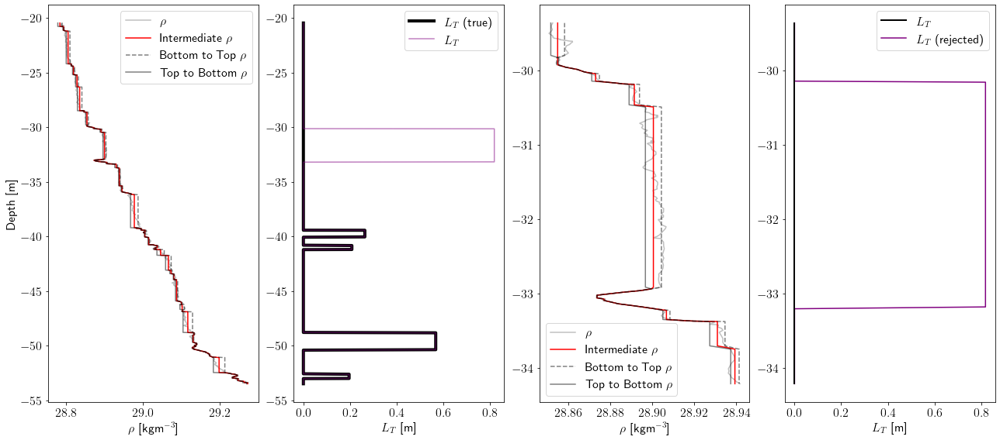

In [412]:
ebb=ebb_proc[6].copy()
i1,i2=1000,2500
ii1,ii2 = 1400,1650


fig,ax = plt.subplots(1,4,figsize=[18,8])
ax[0].plot(ebb["pot_density_anomaly"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='gray',alpha=0.5,label=r'$\rho$')
ax[0].plot(ebb["Intermediate"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='red',label=r'Intermediate $\rho$')
ax[0].plot(ebb["Bottom Top Density"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],linestyle='--',color='black',alpha=0.5,label=r'Bottom to Top $\rho$')
ax[0].plot(ebb["Top Bottom Density"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='black',alpha=0.5,label=r'Top to Bottom $\rho$')

ax[1].plot(ebb["LT_TRUE"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='black',label='$L_T$ (true)',linewidth=4)
ax[1].plot(ebb["LT"].iloc[i1:i2],-ebb["Depth"].iloc[i1:i2],color='purple',label='$L_T$',alpha=0.5)




ax[2].plot(ebb["pot_density_anomaly"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='gray',alpha=0.5,label=r'$\rho$')
ax[2].plot(ebb["Intermediate"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='red',label=r'Intermediate $\rho$')
ax[2].plot(ebb["Bottom Top Density"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],linestyle='--',color='black',alpha=0.5,label=r'Bottom to Top $\rho$')
ax[2].plot(ebb["Top Bottom Density"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='black',alpha=0.5,label=r'Top to Bottom $\rho$')

ax[3].plot(ebb["LT_TRUE"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='black',label='$L_T$',linewidth=2,zorder=2)
ax[3].plot(ebb["LT"].iloc[ii1:ii2],-ebb["Depth"].iloc[ii1:ii2],color='purple',label='$L_T$ (rejected)',zorder=0)
print(ebb["Ro_Ratio"].iloc[ii1:ii2].unique())



for i in range(4):
    ax[i].legend(fontsize=16)
    ax[i].tick_params(axis='both', which='major', labelsize=16) 

ax[0].set_xlabel(r'$\rho$ [kgm$^{-3}$]',fontsize=16)
ax[2].set_xlabel(r'$\rho$ [kgm$^{-3}$]',fontsize=16)
ax[1].set_xlabel(r'$L_T$ [m]',fontsize=16)
ax[3].set_xlabel(r'$L_T$ [m]',fontsize=16)


ax[0].set_ylabel('Depth [m]',fontsize=16)
plt.tight_layout()
plt.savefig('ForWriting/IntermediateDensityProfilesRoRatio.png',dpi=350)
plt.show()

In [414]:
for i in range(len(slack_proc)):
    print(slack_proc[i][slack_proc[i]["Depth"]<5]["pot_density_anomaly"].mean())

28.12471383908636
27.972554248490887
27.511797012095222
26.81288651797643
27.127732074536425
27.334249624309304


In [415]:
for i in range(len(ebb_proc)):
    print(ebb_proc[i][ebb_proc[i]["Depth"]<5]["pot_density_anomaly"].mean())

28.393255605392504
28.397380791071217
28.434583050059114
28.416882491538832
28.41412012294447
28.409880378021718
28.417837495148948
28.43212289611274


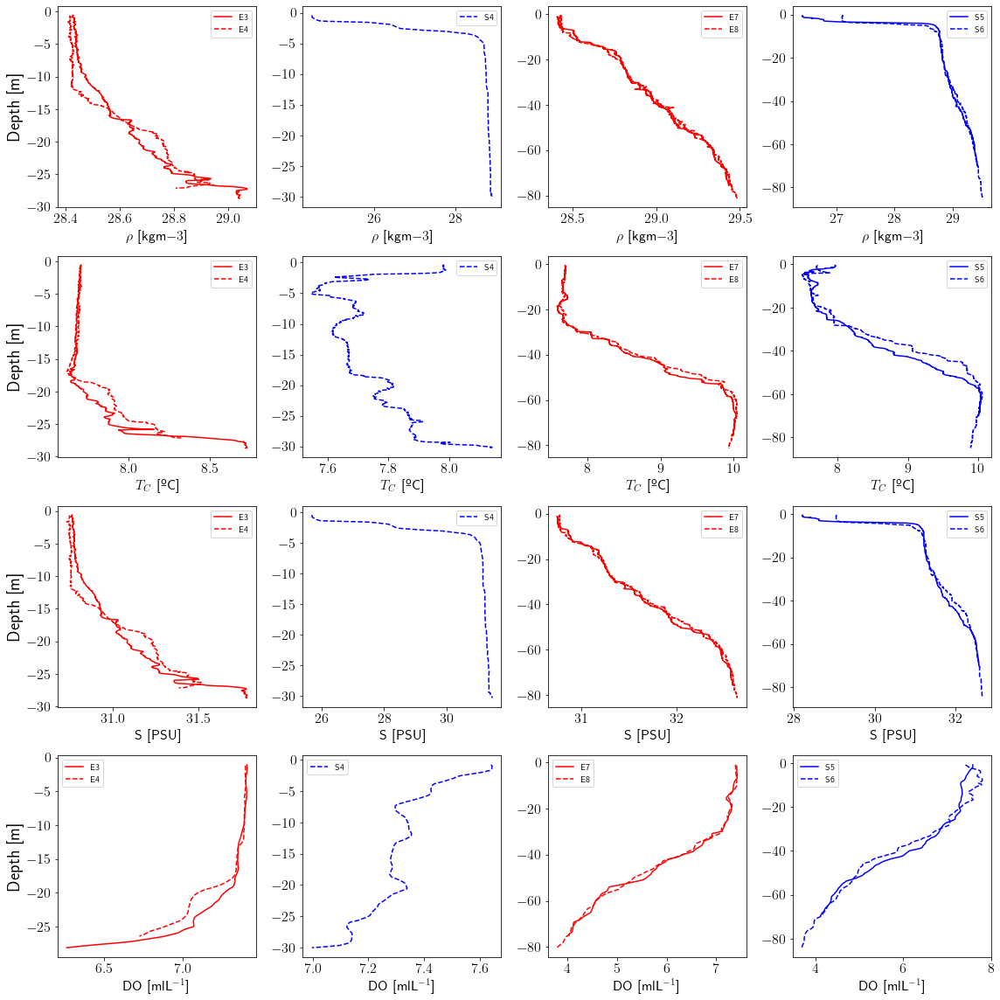

In [256]:
fig,axs=plt.subplots(4,4,figsize=[16,16])
for i in range(6,len(ebb_proc)):
    axs[0][2].plot(ebb_proc[i]["pot_density_anomaly"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-6])
for i in range(4,len(slack_proc)):
    axs[0][3].plot(slack_proc[i]["pot_density_anomaly"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle=linestyles[i-6])

for i in range(2,4):
    axs[0][0].plot(ebb_proc[i]["pot_density_anomaly"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-2])
for i in range(3,4):
    axs[0][1].plot(slack_proc[i]["pot_density_anomaly"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle='--')

    
###


for i in range(6,len(ebb_proc)):
    axs[1][2].plot(ebb_proc[i]["conservative_t"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-6])
for i in range(4,len(slack_proc)):
    axs[1][3].plot(slack_proc[i]["conservative_t"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle=linestyles[i-6])

for i in range(2,4):
    axs[1][0].plot(ebb_proc[i]["conservative_t"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-2])
for i in range(3,4):
    axs[1][1].plot(slack_proc[i]["conservative_t"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle='--')

###
for i in range(6,len(ebb_proc)):
    axs[2][2].plot(ebb_proc[i]["abs_salinity"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-6])
for i in range(4,len(slack_proc)):
    axs[2][3].plot(slack_proc[i]["abs_salinity"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle=linestyles[i-6])

linestyles=['-','--']
for i in range(2,4):
    axs[2][0].plot(ebb_proc[i]["abs_salinity"],-ebb_proc[i]["Depth"],label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-2])
for i in range(3,4):
    axs[2][1].plot(slack_proc[i]["abs_salinity"],-slack_proc[i]["Depth"],label=slack_proc[i]['StationID'][0],color='blue',linestyle='--')

#####

for i in range(6,len(ebb_proc)):
    axs[3][2].plot(ebb_proc[i]["Oxygen"].rolling(window=60,center=True).mean(),-ebb_proc[i]["Depth"].rolling(window=60,center=True).mean(),label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-6])
for i in range(4,len(slack_proc)):
    axs[3][3].plot(slack_proc[i]["Oxygen"].rolling(window=60,center=True).mean(),-slack_proc[i]["Depth"].rolling(window=60,center=True).mean(),label=slack_proc[i]['StationID'][0],color='blue',linestyle=linestyles[i-6])

linestyles=['-','--']
for i in range(2,4):
    axs[3][0].plot(ebb_proc[i]["Oxygen"].rolling(window=60,center=True).mean(),-ebb_proc[i]["Depth"].rolling(window=60,center=True).mean(),label=ebb_proc[i]['StationID'][0],color='red',linestyle=linestyles[i-2])
for i in range(3,4):
    axs[3][1].plot(slack_proc[i]["Oxygen"].rolling(window=60,center=True).mean(),-slack_proc[i]["Depth"].rolling(window=60,center=True).mean(),label=slack_proc[i]['StationID'][0],color='blue',linestyle='--')

for i in range(4):
    for j in range(4):
        axs[i][0].set_ylabel('Depth [m]',fontsize=20)
        axs[i][j].legend()
        axs[i][j].tick_params(axis='both', which='major', labelsize=16) 
        if i==0:
            axs[i][j].set_xlabel(r'$\rho$ [kgm${-3}$]',fontsize=16)
        elif i==1:
            axs[i][j].set_xlabel(r'$T_C$ [ºC]',fontsize=16)
        elif i==2:
            axs[i][j].set_xlabel(r'S [PSU]',fontsize=16)
        else:
            axs[i][j].set_xlabel(r'DO [mlL$^{-1}$]',fontsize=16)

plt.tight_layout()
plt.savefig('ForWriting/ParametersCompared')

In [229]:
ebb_proc[0].keys()

Index(['StationID', 'Longitude', 'Latitude', 'Pressure', 'Temperature',
       'Conductivity', 'Oxygen', 'Depth', 'PressureFilt', 'Flag', 'PressureLF',
       'Sample', 'Temperature_filt', 'Temperature_aligned',
       'Conductivity_filt', 'Conductivity_aligned', 'salinity', 'abs_salinity',
       'conservative_t', 'pot_density_anomaly', 'Fall Speed', 'Fall Speed Raw',
       'Top Bottom Density', 'Bottom Top Density', 'Intermediate', 'rank',
       'Sorted Density', 'Sorted Sample', 'Sorted Depth',
       'Sample Displacements', 'Depth DisplacementsSPEED',
       'Depth Displacements', 'LT', 'Ro_Ratio', 'LTSPEED', 'LT_TRUE', 'LogK'],
      dtype='object')

In [167]:
for i in range(len(slack_proc)):
    print(slack_proc[i]["abs_salinity"].min())

for i in range(len(ebb_proc)):
    print(ebb_proc[i]["abs_salinity"].min())

29.42807234719672
27.1076953222714
27.232555888520178
25.682603428177938
28.200665239451705
29.040691412352913
30.692732675792723
30.69136504000115
30.761141526903863
30.734560470980497
30.7399377018292
30.734238202845678
30.74220223637073
30.76070088824481


28.768220100351378
28.782763221554365
28.821905691382376
28.819114667918157
29.093283663323128
29.16704455182054
28.59799695708762
28.604118580506697
28.59504057167102
28.56150963419903
28.603621006181353
28.786861828942275
28.9647388974421
29.015022507776635


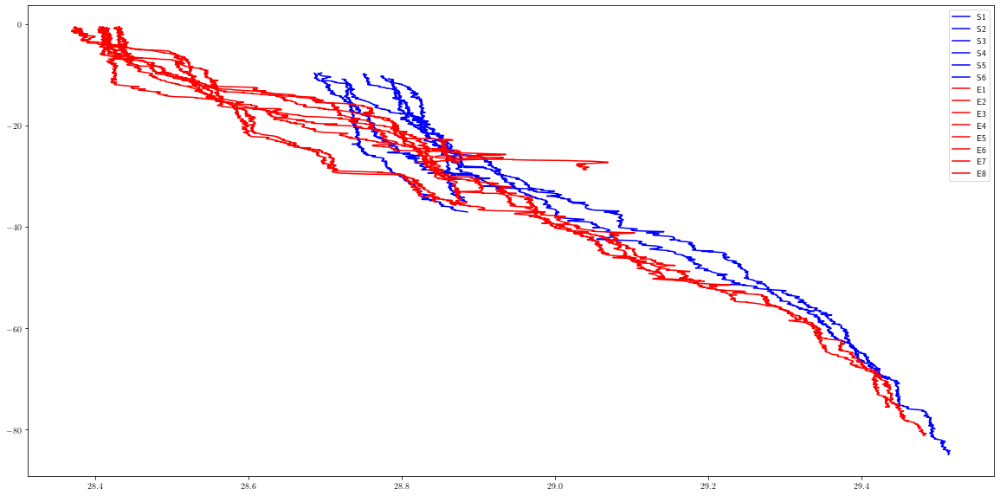

In [218]:
plt.figure(figsize=[20,10])
colors = [
    "#FF0000",  # Red
    "#FF3E00",  # Orange-Red
    "#FF7D00",  # Orange
    "#FFBF00",  # Yellow-Orange
    "#80FF00",  # Yellow-Green
    "#00FF3E",  # Green
    "#00FFBF",  # Turquoise
    "#00BFFF"   # Deep Sky Blue
]
for i in range(len(slack_proc)):
    plt.plot(slack_proc[i]["pot_density_anomaly"].iloc[600:-1],-slack_proc[i]["Depth"].iloc[600:-1],color='blue',label=slack_proc[i]["StationID"][0])
    print(slack_proc[i]["pot_density_anomaly"].iloc[600:-1].mean())

for i in range(len(ebb_proc)):
    plt.plot(ebb_proc[i]["pot_density_anomaly"].iloc[0:-1],-ebb_proc[i]["Depth"].iloc[0:-1],color='red',label=ebb_proc[i]["StationID"][0])
    print(ebb_proc[i]["pot_density_anomaly"].iloc[0:-1].mean())
    
plt.legend()

0.0034653503761524393
0.005231112549186994
0.008409532138865177
0.004287733841076379
0.007827987505996984
0.008697515083640554
b 0.006319871915819755


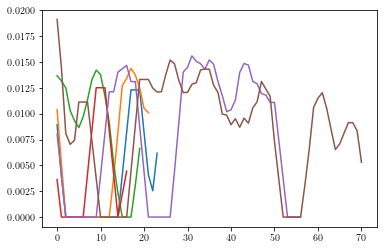

In [205]:
mean=[]
for i in range(len(NsSLACK)):
    plt.plot(NsSLACK[i][6:-1])
    mean.append(np.mean(NsSLACK[i][6:-1]))
    print(np.mean(NsSLACK[i][6:-1]))

print('b',np.mean(mean))

In [270]:
result1 = THORPEEBB[["StationID", "LT_TRUE"]].groupby("StationID").mean()
result2 = THORPEEBB[["StationID", "LT_TRUE"]].groupby("StationID").count()
result1,result2

(            LT_TRUE
 StationID          
 E1         0.228794
 E2         0.203051
 E3         0.558287
 E4         0.625241
 E5         0.165019
 E6         0.737877
 E7         0.333254
 E8         0.252556,
            LT_TRUE
 StationID         
 E1               2
 E2               2
 E3               5
 E4               3
 E5               3
 E6               5
 E7               6
 E8              10)

In [650]:
tides


,Date,observations (m),Observations minus predictions (m)
0,2025-03-26 10:59 PDT,3.29,0.14
1,2025-03-26 10:58 PDT,3.28,0.13
2,2025-03-26 10:57 PDT,3.29,0.14
3,2025-03-26 10:56 PDT,3.30,0.15
4,2025-03-26 10:55 PDT,3.29,0.14
...,...,...,...
1434,2025-03-25 11:05 PDT,2.84,0.03
1435,2025-03-25 11:04 PDT,2.85,0.04
1436,2025-03-25 11:03 PDT,2.85,0.03
1437,2025-03-25 11:02 PDT,2.86,0.03


In [685]:
tides = pd.read_csv('SatellitePassage_Data/observations_tides.csv').dropna()
tides['Date'] = tides['Date'].str.replace(r'\s[P|A|C|E|T|D|S]{3}$', '', regex=True)

tides['Date'] = pd.to_datetime(tides['Date'], errors='coerce')
tides['Day']=pd.to_datetime(tides['Date'].dt.date)
tides['Hour']=tides['Date'].dt.time


In [689]:
tides['Day'] = tides['Day'].dt.normalize()

# Now filter the DataFrame for the specified date range (including both dates)
start_date = pd.to_datetime('2025-02-21').normalize()
end_date = pd.to_datetime('2025-02-22').normalize()

# Filter for dates between '2025-02-21' and '2025-02-22' inclusive
tides = tides[(tides['Day'] >= start_date) & (tides['Day'] <= end_date)]
tides

,Date,observations (m),Observations minus predictions (m),Day,Hour
5055,2025-02-22 23:59:00,2.31,0.03,2025-02-22,23:59:00
5056,2025-02-22 23:58:00,2.31,0.03,2025-02-22,23:58:00
5057,2025-02-22 23:57:00,2.30,0.02,2025-02-22,23:57:00
5058,2025-02-22 23:56:00,2.31,0.03,2025-02-22,23:56:00
5059,2025-02-22 23:55:00,2.33,0.04,2025-02-22,23:55:00
...,...,...,...,...,...
7930,2025-02-21 00:04:00,1.74,-0.14,2025-02-21,00:04:00
7931,2025-02-21 00:03:00,1.74,-0.14,2025-02-21,00:03:00
7932,2025-02-21 00:02:00,1.74,-0.14,2025-02-21,00:02:00
7933,2025-02-21 00:01:00,1.74,-0.14,2025-02-21,00:01:00


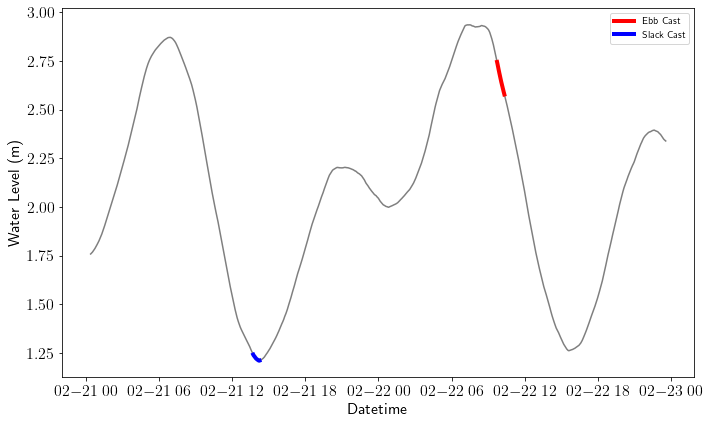

In [745]:
plt.figure(figsize=[10,6])
obs = tides['observations (m)'].rolling(window=50,center=True).mean()
idx = obs.index

ebbobs = ebbtime['observations (m)'].rolling(window=50,center=True).mean()
idxebb = ebbobs.index

slackobs = slacktime['observations (m)'].rolling(window=50,center=True).mean()
idxslack = slackobs.index

plt.plot(tides['Date'].loc[idxebb],ebbobs,color='red',linewidth=4,label='Ebb Cast')
plt.plot(tides['Date'].loc[idxslack],slackobs,color='blue',linewidth=4,label='Slack Cast')
plt.plot(tides['Date'].loc[idx],obs,color='black',zorder=1,alpha=0.5)
plt.tick_params(axis='both', which='major', labelsize=16) 
plt.xlabel(r'Datetime',fontsize=16)
plt.ylabel('Water Level (m)',fontsize=16)
plt.legend()
plt.tight_layout()
plt.savefig('ForWriting/Tides.png',dpi=350)
plt.show()

In [743]:
hoursslackstart = pd.to_datetime('13:20:00').time()
hoursslackend = pd.to_datetime('14:40:00').time()

slacktime = tides[(tides['Hour']>=hoursslackstart)&(tides['Hour']<=hoursslackend)&(tides['Day'] == start_date)]

hoursebbstart = pd.to_datetime('9:20:00').time()
hoursebbend = pd.to_datetime('10:45:00').time()

ebbtime = tides[(tides['Hour']>=hoursebbstart)&(tides['Hour']<=hoursebbend)&(tides['Day'] == end_date)]


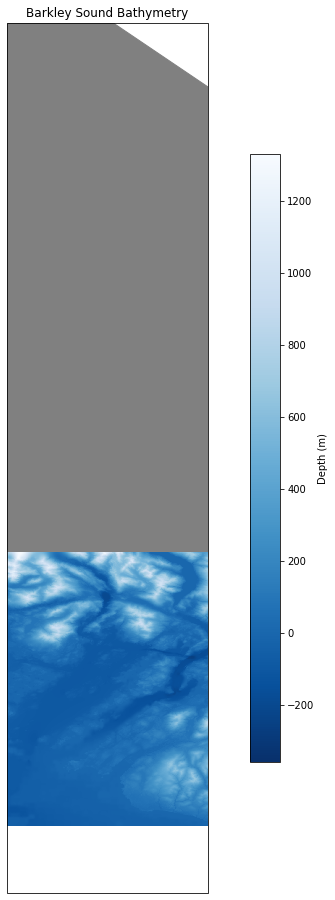

In [203]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from netCDF4 import Dataset

def load_bathymetry_netcdf(file_path):
    """Load bathymetry data from a NetCDF file"""
    # Open the NetCDF file
    dataset = Dataset(file_path, 'r')

    # Extract latitude, longitude, and bathymetry data
    latitudes = dataset.variables['lat'][:]  # Latitude data
    longitudes = dataset.variables['lon'][:]  # Longitude data
    bathymetry = dataset.variables['Band1'][:]  # Bathymetry data (depths)

    return latitudes, longitudes, bathymetry

def plot_bathymetry(latitudes, longitudes, bathymetry, title="Barkley Sound Bathymetry", zoom_extent=None):
    """Plot the bathymetry data from a NetCDF file"""
    fig, ax = plt.subplots(figsize=(15, 16), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # If a zoom extent is provided, use it; otherwise, default to the larger Barkley Sound region
    if zoom_extent:
        ax.set_extent(zoom_extent, crs=ccrs.PlateCarree())  # Define the region to zoom into
    else:
        ax.set_extent([-125.2, -125.1, 48.9, 49.8], crs=ccrs.PlateCarree())  # Default to the full Barkley Sound region

    # Plot the bathymetry data as a pcolormesh
    cmap = plt.cm.Blues_r  # Use reversed blues colormap
    im = ax.pcolormesh(longitudes, latitudes, bathymetry, cmap=cmap, shading='auto')

    # Add coastlines and land
    ax.add_feature(cfeature.LAND, color='grey')
    # ax.coastlines(lw=1, resolution='110m')
    # ax.gridlines(draw_labels=False)

    # Add a colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.7)
    cbar.set_label("Depth (m)")

    # Add a title
    ax.set_title(title)

    # Show the plot
    plt.show()

if __name__ == "__main__":
    # Path to your NetCDF file (replace with the correct file path)
    file_path = 'SatellitePassage_Data/barkley_sound_bathymetry.nc'  # Replace with your actual file path

    # Load the data from the NetCDF file
    latitudes, longitudes, bathymetry = load_bathymetry_netcdf(file_path)

    # Define the zoom region (bounding box in [min_lon, max_lon, min_lat, max_lat])
    zoom_extent = [-125.3, -125.0, 48.6, 49.9] 

    # Plot the bathymetry data
    plot_bathymetry(latitudes, longitudes, bathymetry, zoom_extent=zoom_extent)


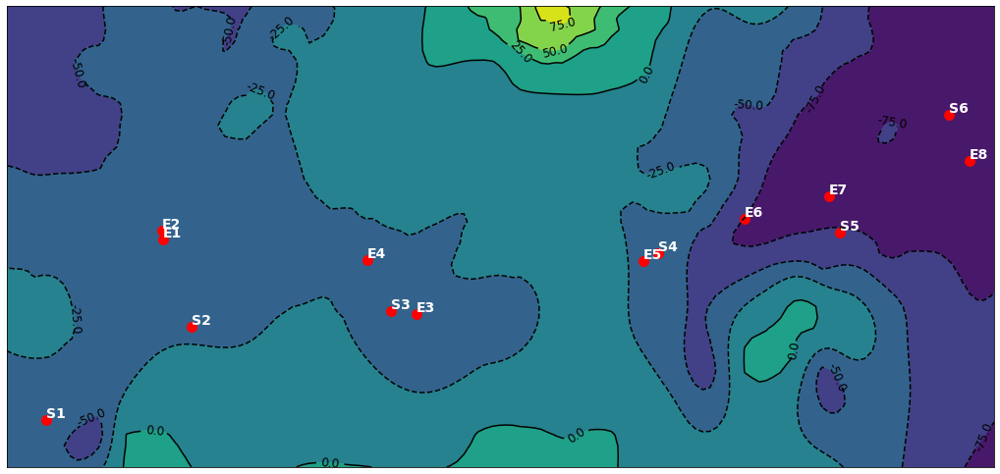

In [290]:
import netCDF4
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt
from numpy import flipud

# Load data
dataset = netCDF4.Dataset('SatellitePassage_Data/barkley_sound_bathymetry.nc')

lon = dataset.variables['lon'][:]
lat = dataset.variables['lat'][:]
Z = dataset.variables['Band1'][:]

# Set up Basemap
m = Basemap(llcrnrlon=-125.19, llcrnrlat=48.855, urcrnrlon=-125.151, urcrnrlat=48.867,
            resolution='f', projection='lcc', lon_0=-125.16, lat_0=48.859)

# Create a larger figure
plt.figure(figsize=(18, 15))  # Change this line to make the plot bigger

# Convert lon/lat to map projection
x, y = m(*np.meshgrid(lon, lat))





# Plot the data
m.contourf(x, y, Z)  
m.fillcontinents(color='grey')  # Fill land with grey color
m.drawcoastlines()  # Draw coastlines
m.drawcountries()  # Draw countries

contour_lines = m.contour(x, y, Z, colors='black')  # Add contour lines
plt.clabel(contour_lines, inline=True, fontsize=12, fmt='%1.1f', inline_spacing=5)  # Add contour labels


#add the stations
x_pts, y_pts = m(unique_stations['Longitude'], unique_stations['Latitude'])  # Convert the coordinates to map projection
m.scatter(x_pts, y_pts, color='red', marker='o', s=100, label="Points")  # Plot the points

for i, label in enumerate(unique_stations['StationID']):
    plt.text(x_pts[i], y_pts[i], label, color='white', fontsize=14, ha='left', va='bottom',fontweight='bold')


# Show the plot
plt.savefig('bathymetry.png',dpi=350)
plt.show()


In [287]:
drifting

,StationID,LatDeg,LatDeci,LonDeg,LonDeci,Latitude,Longitude
0,S1.1,48,51.377,125,11.315,48.856283,-125.188583
1,S1.2,48,51.389,125,11.316,48.856483,-125.188600
2,S1.3,48,51.396,125,11.335,48.856600,-125.188917
3,S1.4,48,51.400,125,11.364,48.856667,-125.189400
4,S1.5,48,51.415,125,11.388,48.856917,-125.189800
5,S2.1,48,51.522,125,10.965,48.858700,-125.182750
6,S2.2,48,51.548,125,10.974,48.859133,-125.182900
7,S2.3,48,51.573,125,10.988,48.859550,-125.183133
8,S2.4,48,51.583,125,10.993,48.859717,-125.183217
9,S2.4,48,51.598,125,10.996,48.859967,-125.183267


In [336]:
np.sqrt(1e-3)

0.03162277660168379